# 1.Data exploration and pre-processing

In [1]:
#Importing common libraries
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
pd.options.display.max_columns = None #Display of complete print data
pd.options.display.max_rows = None
plt.rcParams['font.sans-serif'] = ['Microsoft YaHei'] # Used to display Chinese properly
plt.rcParams['axes.unicode_minus']=False    # Used to display the negative sign normally
plt.rcParams['figure.dpi'] = 150 # Modify picture resolution
plt.rcParams.update({'font.size': 12}) # Modify the overall font size of the image
import numpy as np
from sklearn.metrics import mean_squared_error 
from sklearn.metrics import mean_absolute_error 
from sklearn import metrics
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import BayesianRidge
from sklearn import ensemble
import xgboost as xgb # 1.5.0
import lightgbm as lgb # 2.2.3
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder #Coded as number
from skopt import BayesSearchCV
from skopt.space import Real, Categorical, Integer
import warnings
warnings.filterwarnings("ignore") # Ignore warnings

In [2]:
# Read Data
data1 = pd.read_excel('train.xlsx')
# View the first 5 rows of data
data1.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,Not in Labor Force,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,Employed,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,Not in Labor Force,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,Employed,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [3]:
# Read data
data2 = pd.read_excel('test.xlsx')
# View the first 5 rows of data
data2.head()

,respondent_id,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,employment_status,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,26707,2.0,2.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,1.0,1.0,5.0,1.0,1.0,35 - 44 Years,College Graduate,Hispanic,Female,"> $75,000",Not Married,Rent,Employed,mlyzmhmf,"MSA, Not Principle City",1.0,0.0,atmlpfrs,hfxkjkmi
1,26708,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,1.0,1.0,4.0,1.0,1.0,18 - 34 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,Employed,bhuqouqj,Non-MSA,3.0,0.0,atmlpfrs,xqwwgdyp
2,26709,2.0,2.0,0.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,5.0,4.0,2.0,5.0,4.0,4.0,55 - 64 Years,College Graduate,White,Male,"> $75,000",Married,Own,Employed,lrircsnp,Non-MSA,1.0,0.0,nduyfdeo,pvmttkik
3,26710,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,1.0,4.0,2.0,2.0,4.0,4.0,2.0,65+ Years,12 Years,White,Female,"<= $75,000, Above Poverty",Married,Own,Not in Labor Force,lrircsnp,"MSA, Not Principle City",1.0,0.0,NaN,NaN
4,26711,3.0,1.0,1.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0,2.0,4.0,4.0,4.0,2.0,35 - 44 Years,12 Years,Black,Female,"<= $75,000, Above Poverty",Not Married,Own,Employed,lzgpxyit,Non-MSA,0.0,1.0,fcxhlnwr,mxkfnird


In [4]:
data1.shape

(26707, 38)

In [5]:
data2.shape

(26708, 36)

In [6]:
# Delete home_score, away_score with high correlation
data = data1.drop(['respondent_id','employment_status'],axis=1)
data.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,1.0,2.0,2.0,1.0,2.0,55 - 64 Years,< 12 Years,White,Female,Below Poverty,Not Married,Own,oxchjgsf,Non-MSA,0.0,0.0,NaN,NaN,0,0
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,35 - 44 Years,12 Years,White,Male,Below Poverty,Not Married,Rent,bhuqouqj,"MSA, Not Principle City",0.0,0.0,pxcmvdjn,xgwztkwe,0,1
2,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,1.0,0.0,0.0,NaN,3.0,1.0,1.0,4.0,1.0,2.0,18 - 34 Years,College Graduate,White,Male,"<= $75,000, Above Poverty",Not Married,Own,qufhixun,"MSA, Not Principle City",2.0,0.0,rucpziij,xtkaffoo,0,0
3,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,NaN,3.0,3.0,5.0,5.0,4.0,1.0,65+ Years,12 Years,White,Female,Below Poverty,Not Married,Rent,lrircsnp,"MSA, Principle City",0.0,0.0,NaN,NaN,0,1
4,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,NaN,3.0,3.0,2.0,3.0,1.0,4.0,45 - 54 Years,Some College,White,Female,"<= $75,000, Above Poverty",Married,Own,qufhixun,"MSA, Not Principle City",1.0,0.0,wxleyezf,emcorrxb,0,0


In [7]:
# View data shapes
data.shape

(26707, 36)

In [8]:
# Look at the distribution of data types and find that there is data that needs to be encoded
data.dtypes

h1n1_concern                   float64
h1n1_knowledge                 float64
behavioral_antiviral_meds      float64
behavioral_avoidance           float64
behavioral_face_mask           float64
behavioral_wash_hands          float64
behavioral_large_gatherings    float64
behavioral_outside_home        float64
behavioral_touch_face          float64
doctor_recc_h1n1               float64
doctor_recc_seasonal           float64
chronic_med_condition          float64
child_under_6_months           float64
health_worker                  float64
health_insurance               float64
opinion_h1n1_vacc_effective    float64
opinion_h1n1_risk              float64
opinion_h1n1_sick_from_vacc    float64
opinion_seas_vacc_effective    float64
opinion_seas_risk              float64
opinion_seas_sick_from_vacc    float64
age_group                       object
education                       object
race                            object
sex                             object
income_poverty           

In [9]:
# Numerical characterisation
data.describe()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,household_adults,household_children,h1n1_vaccine,seasonal_vaccine
count,26615.000000,26591.000000,26636.000000,26499.000000,26688.000000,26665.000000,26620.00000,26625.000000,26579.000000,24547.000000,24547.000000,25736.000000,25887.000000,25903.000000,14433.00000,26316.000000,26319.000000,26312.000000,26245.000000,26193.000000,26170.000000,26458.000000,26458.000000,26707.000000,26707.000000
mean,1.618486,1.262532,0.048844,0.725612,0.068982,0.825614,0.35864,0.337315,0.677264,0.220312,0.329735,0.283261,0.082590,0.111918,0.87972,3.850623,2.342566,2.357670,4.025986,2.719162,2.118112,0.886499,0.534583,0.212454,0.465608
std,0.910311,0.618149,0.215545,0.446214,0.253429,0.379448,0.47961,0.472802,0.467531,0.414466,0.470126,0.450591,0.275266,0.315271,0.32530,1.007436,1.285539,1.362766,1.086565,1.385055,1.332950,0.753422,0.928173,0.409052,0.498825
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,1.000000,1.000000,0.000000,0.000000,0.000000,1.000000,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,3.000000,1.000000,1.000000,4.000000,2.000000,1.000000,0.000000,0.000000,0.000000,0.000000
50%,2.000000,1.000000,0.000000,1.000000,0.000000,1.000000,0.00000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.00000,4.000000,2.000000,2.000000,4.000000,2.000000,2.000000,1.000000,0.000000,0.000000,0.000000
75%,2.000000,2.000000,0.000000,1.000000,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,1.00000,5.000000,4.000000,4.000000,5.000000,4.000000,4.000000,1.000000,1.000000,0.000000,1.000000
max,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,5.000000,5.000000,5.000000,5.000000,5.000000,5.000000,3.000000,3.000000,1.000000,1.000000


In [10]:
# of missing values per column checked, no missing values
data.isnull().sum()

h1n1_concern                      92
h1n1_knowledge                   116
behavioral_antiviral_meds         71
behavioral_avoidance             208
behavioral_face_mask              19
behavioral_wash_hands             42
behavioral_large_gatherings       87
behavioral_outside_home           82
behavioral_touch_face            128
doctor_recc_h1n1                2160
doctor_recc_seasonal            2160
chronic_med_condition            971
child_under_6_months             820
health_worker                    804
health_insurance               12274
opinion_h1n1_vacc_effective      391
opinion_h1n1_risk                388
opinion_h1n1_sick_from_vacc      395
opinion_seas_vacc_effective      462
opinion_seas_risk                514
opinion_seas_sick_from_vacc      537
age_group                          0
education                       1407
race                               0
sex                                0
income_poverty                  4423
marital_status                  1408
r

In [11]:
data=data.dropna(axis=0,how='any')

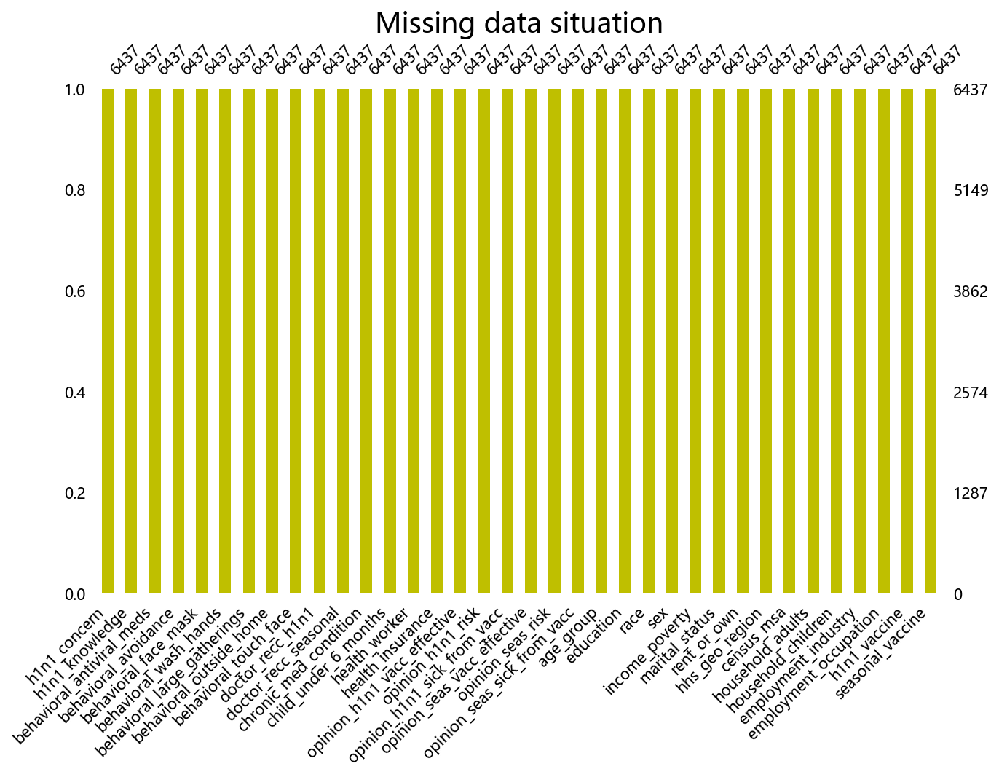

In [12]:
# Visualisation of missing data
import missingno as msno
plt.figure()
p=msno.bar(data,color='y',figsize=(10,6),fontsize=10)
plt.title('Missing data situation',fontsize=18)
plt.savefig('Missing data situation.png',dpi=300,bbox_inches = 'tight')# Saved as HD image, shown without saved HD

0    4502
1    1935
Name: h1n1_vaccine, dtype: int64


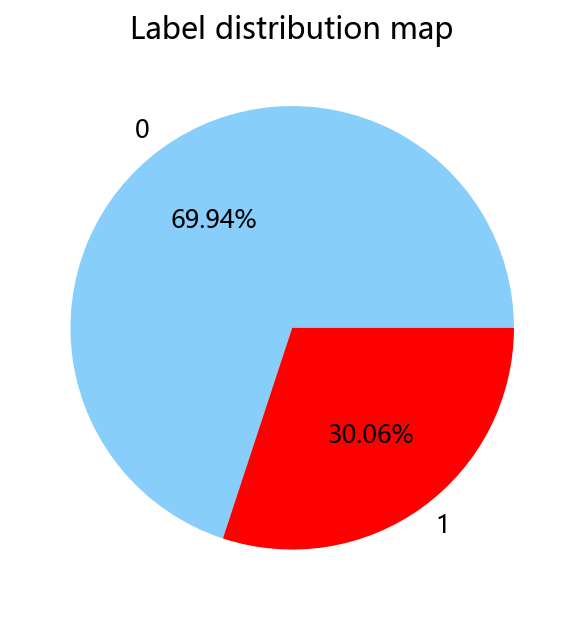

In [13]:
# View data label distribution, balance
print(data['h1n1_vaccine'].value_counts())
plt.pie(data['h1n1_vaccine'].value_counts(),labels=data['h1n1_vaccine'].value_counts().index,
        autopct='%1.2f%%',
        colors = ['lightskyblue','red','magenta','royalblue'])
plt.title('Label distribution map')
plt.savefig('Label distribution map.png',dpi=300,bbox_inches = 'tight')
plt.show()

In [14]:
# Encoding of string data sets
from sklearn.preprocessing import LabelEncoder 
dtypes_list=data.dtypes.values
columns_list=data.columns
for i in range(len(columns_list)):
    if dtypes_list[i]=='object':#coded as a number
        lb=LabelEncoder()
        lb.fit(data[columns_list[i]])
        data[columns_list[i]]=lb.transform(data[columns_list[i]])
data.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation,h1n1_vaccine,seasonal_vaccine
1,3.0,2.0,0.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,5.0,4.0,4.0,4.0,2.0,4.0,1,0,3,1,2,1,1,1,0,0.0,0.0,12,19,0,1
7,1.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,5.0,2.0,1.0,4.0,2.0,1.0,2,3,3,0,0,0,0,1,2,2.0,0.0,12,20,1,1
10,2.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,0.0,4.0,1.0,2.0,5.0,4.0,4.0,2,0,3,1,0,0,1,6,0,2.0,0.0,19,13,1,1
11,1.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,3.0,2.0,2.0,4.0,2.0,1.0,3,2,3,1,1,0,0,8,2,1.0,2.0,19,1,1,1
15,1.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,4.0,2.0,2.0,2.0,1.0,1.0,1,2,3,0,1,0,0,6,0,1.0,3.0,18,5,0,0


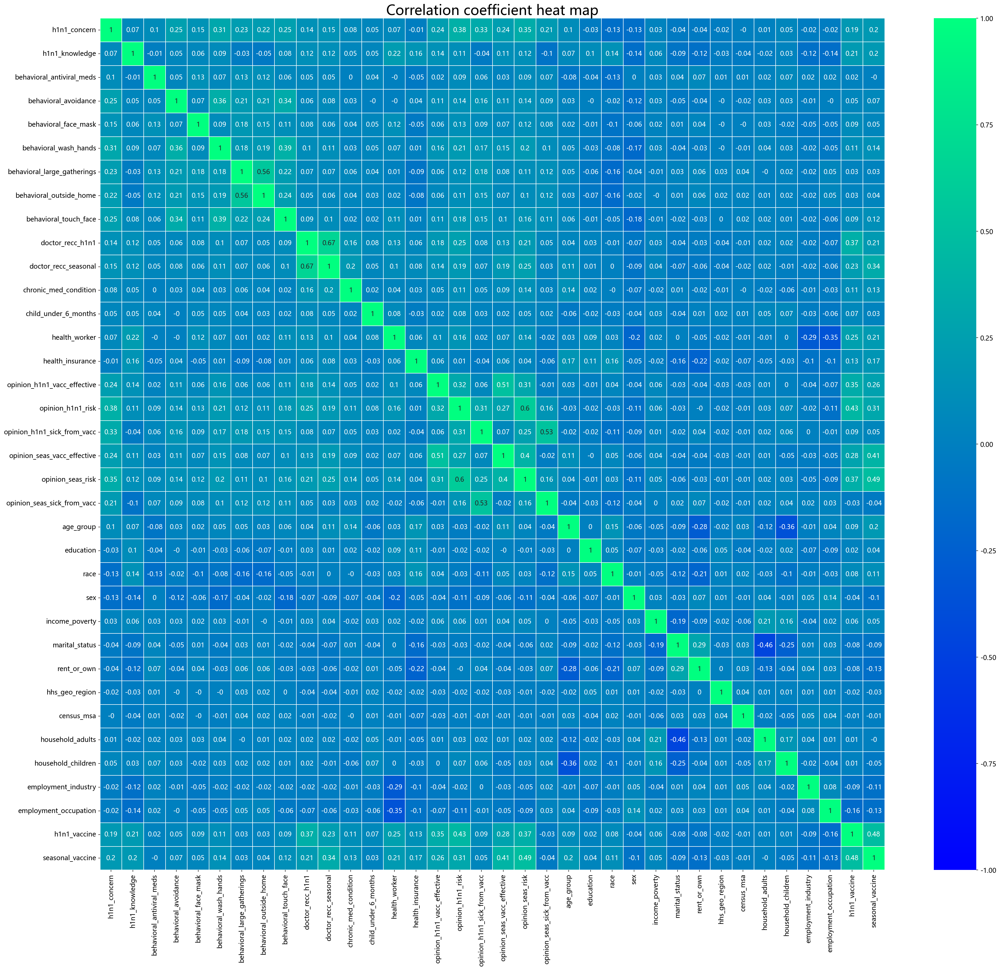

In [15]:
# Draw a heat map where the value is the correlation coefficient between two variables, from which you can see the correlation (positive or negative) between each variable and the magnitude of the correlation.
plt.figure(figsize=(32,28))
cov = data.corr(method='spearman').round(2)
sns.heatmap(cov,cmap='winter',annot=True,linewidths=0.1,vmin=-1,)
plt.title('Correlation coefficient heat map',size=25)
plt.savefig('Correlation coefficient heat map.png',dpi=300,bbox_inches = 'tight')
cov.to_csv('Correlation coefficient.csv',index=False)

In [16]:
# Separate features and labels
x = data.drop(['h1n1_vaccine','seasonal_vaccine'],axis=1)
y = data['seasonal_vaccine']

In [17]:
# Data splitting
# 7 to 3 split training set, test set, set random seed random_state, ensure experiment is reproducible
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, 
                                                    y,
                                                    test_size=0.3,
                                                    stratify=y,
                                                    random_state=20)

In [18]:
x_train.shape,x_test.shape

((4505, 34), (1932, 34))

In [19]:
x_train.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
8111,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,4.0,1.0,2.0,2.0,2.0,1.0,2,2,3,1,1,0,0,9,0,2.0,0.0,3,4
7137,0.0,2.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,5.0,4.0,4.0,5.0,2.0,2.0,0,0,3,1,1,0,0,7,1,1.0,0.0,15,9
6055,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,4.0,3.0,1.0,4.0,2.0,2.0,3,3,3,1,1,0,0,5,2,1.0,0.0,19,13
19639,2.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,5.0,2.0,4.0,5.0,2.0,4.0,0,0,1,1,0,1,1,5,1,3.0,0.0,10,12
14553,2.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,4.0,4.0,4.0,4.0,5.0,4.0,0,0,3,1,0,1,1,6,1,1.0,0.0,12,19


# Data normalisation codes

In [20]:
# Data normalisation code
# Take out column names, which disappear when data is normalised
com= x_train.columns
# Data standardisation
from sklearn.preprocessing import StandardScaler
AAA = StandardScaler().fit(x_train) ## Generate rules
x_train = AAA.transform(x_train) # Application of rules to the training set
x_test = AAA.transform(x_test) # Application of rules to the testing set
# Go back to DataFrame
x_train = pd.DataFrame(x_train)
x_test = pd.DataFrame(x_test)
# Add back the column name
x_train.columns = com
x_test.columns = com
x_train.head()

,h1n1_concern,h1n1_knowledge,behavioral_antiviral_meds,behavioral_avoidance,behavioral_face_mask,behavioral_wash_hands,behavioral_large_gatherings,behavioral_outside_home,behavioral_touch_face,doctor_recc_h1n1,doctor_recc_seasonal,chronic_med_condition,child_under_6_months,health_worker,health_insurance,opinion_h1n1_vacc_effective,opinion_h1n1_risk,opinion_h1n1_sick_from_vacc,opinion_seas_vacc_effective,opinion_seas_risk,opinion_seas_sick_from_vacc,age_group,education,race,sex,income_poverty,marital_status,rent_or_own,hhs_geo_region,census_msa,household_adults,household_children,employment_industry,employment_occupation
0,-0.553035,-0.585197,-0.239298,0.626906,-0.253490,0.466794,1.661455,1.730258,0.700172,-0.547169,-0.638946,-0.526927,3.047193,-0.473833,0.363976,0.051138,-1.033641,-0.199958,-1.829533,-0.509574,-0.825514,0.233378,0.150403,0.450497,1.120158,0.727235,-0.844350,-0.542716,1.452651,-1.011902,1.363747,-0.663499,-0.996611,-1.058244
1,-1.720524,1.127807,-0.239298,0.626906,-0.253490,0.466794,-0.601882,-0.577948,0.700172,-0.547169,-0.638946,-0.526927,-0.328171,2.110449,0.363976,1.061570,1.282284,1.307674,0.935018,-0.509574,-0.059038,-1.376680,-1.793826,0.450497,1.120158,0.727235,-0.844350,-0.542716,0.745820,0.213204,0.045078,-0.663499,0.808306,-0.339549
2,-0.553035,-0.585197,-0.239298,-1.595134,-0.253490,0.466794,-0.601882,-0.577948,-1.428220,-0.547169,-0.638946,-0.526927,-0.328171,-0.473833,0.363976,0.051138,0.510309,-0.953774,0.013501,-0.509574,-0.059038,1.038407,1.122517,0.450497,1.120158,0.727235,-0.844350,-0.542716,0.038989,1.438310,0.045078,-0.663499,1.409945,0.235406
3,0.614454,-0.585197,4.178889,0.626906,3.944933,0.466794,1.661455,1.730258,0.700172,-0.547169,-0.638946,-0.526927,-0.328171,-0.473833,-2.747433,1.061570,-0.261666,1.307674,0.935018,-0.509574,1.473914,-1.376680,-1.793826,-1.789559,1.120158,-0.881898,1.184342,1.842586,0.038989,0.213204,2.682416,-0.663499,0.056258,0.091667
4,0.614454,-0.585197,-0.239298,0.626906,-0.253490,0.466794,-0.601882,-0.577948,0.700172,-0.547169,-0.638946,-0.526927,-0.328171,-0.473833,-2.747433,0.051138,1.282284,1.307674,0.013501,1.667068,1.473914,-1.376680,-1.793826,0.450497,1.120158,-0.881898,1.184342,1.842586,0.392405,0.213204,0.045078,-0.663499,0.357077,1.097840


# 2.Multi-model comparison

In [21]:
# Defining model evaluation indicators
def try_different_method(model,f_):
    model.fit(x_train[f_],y_train)
    y_predict = model.predict(x_test[f_])
    y_predict11 =model.predict_proba(x_test[f_])[:,1]
    y_predict1 = model.predict(x_train[f_])
    y_predict12 =model.predict_proba(x_train[f_])[:,1]
    fpr, tpr, thresholds = metrics.roc_curve(y_train,y_predict12)
    print('Training set evaluation metrics：')
    print('The accuracy rate is: ', '%.4f'%float(metrics.accuracy_score(y_train,y_predict1)),\
    'AUC values are: ', '%.4f'%float(metrics.roc_auc_score(y_train,y_predict12)),\
    'KS values are: ', '%.4f'%float(max(tpr-fpr)),\
    'F1 values are: ', '%.4f'%float(metrics.f1_score(y_train,y_predict1,average='weighted')),\
    'Accuracy rate of: ', '%.4f'%float(metrics.precision_score(y_train,y_predict1,average='weighted')),\
    'The recall rate is: ', '%.4f'%float(metrics.recall_score(y_train,y_predict1,average='weighted')))
    fpr, tpr, thresholds = metrics.roc_curve(y_test,y_predict11) 
    print('Test set evaluation indicators：')
    print('The accuracy rate is: ', '%.4f'%float(metrics.accuracy_score(y_test,y_predict)),\
    'AUC values are: ', '%.4f'%float(metrics.roc_auc_score(y_test,y_predict11)),\
    'KS values are: ', '%.4f'%float(max(tpr-fpr)),\
    'F1 values are: ', '%.4f'%float(metrics.f1_score(y_test,y_predict,average='weighted')),\
    'Accuracy rate of: ', '%.4f'%float(metrics.precision_score(y_test,y_predict,average='weighted')),\
    'The recall rate is: ', '%.4f'%float(metrics.recall_score(y_test,y_predict,average='weighted')))
    print('\n')

In [22]:
# Build different models
# Import the required packages
import xgboost as xgb
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier

# Model building
model_DT1 = DecisionTreeClassifier(random_state=2022,
                                       max_depth=6
                                                )
model_RF1 = ensemble.RandomForestClassifier(random_state=2022,
                                       max_depth=6,
                                        n_estimators=10
                                       )

model_XGB1 = xgb.XGBClassifier(random_state=2022,
                            verbosity=0,
                             n_jobs=-1,
                             max_depth=3, 
                            learning_rate=0.1, 
                            n_estimators=100)

model_GBDT1 = ensemble.GradientBoostingClassifier(random_state=2022,
                             max_depth=3, 
                            learning_rate=0.1, 
                            n_estimators=100

                                            )

model_LGB1 = lgb.LGBMClassifier(random_state=2022,
                            max_depth=3, 
                            learning_rate=0.01, 
                            n_estimators=100
                            )

In [23]:
f_top=x_train.columns.tolist()

In [24]:
print('The decision tree model was scored as follows：\n')
try_different_method(model_DT1,f_top)
print('The random forest model scores are as follows：\n')
try_different_method(model_RF1,f_top)
print('The XGboost model scores are as follows：\n')
try_different_method(model_XGB1,f_top)
print('The gradient lifting tree model scores are as follows：\n')
try_different_method(model_GBDT1,f_top)
print('The LightGBM model scores are as follows：\n')
try_different_method(model_LGB1,f_top)

The decision tree model was scored as follows：

Training set evaluation metrics：
The accuracy rate is:  0.8029 AUC values are:  0.8766 KS values are:  0.6012 F1 values are:  0.8025 Accuracy rate of:  0.8027 The recall rate is:  0.8029
Test set evaluation indicators：
The accuracy rate is:  0.7655 AUC values are:  0.8311 KS values are:  0.5342 F1 values are:  0.7653 Accuracy rate of:  0.7652 The recall rate is:  0.7655


The random forest model scores are as follows：

Training set evaluation metrics：
The accuracy rate is:  0.8042 AUC values are:  0.8828 KS values are:  0.6061 F1 values are:  0.8026 Accuracy rate of:  0.8063 The recall rate is:  0.8042
Test set evaluation indicators：
The accuracy rate is:  0.7785 AUC values are:  0.8575 KS values are:  0.5672 F1 values are:  0.7770 Accuracy rate of:  0.7792 The recall rate is:  0.7785


The XGboost model scores are as follows：

Training set evaluation metrics：
The accuracy rate is:  0.8202 AUC values are:  0.9008 KS values are:  0.6453 F1

Decision Trees test report: 
               precision    recall  f1-score   support

           0       0.78      0.79      0.79      1048
           1       0.75      0.73      0.74       884

    accuracy                           0.77      1932
   macro avg       0.76      0.76      0.76      1932
weighted avg       0.77      0.77      0.77      1932



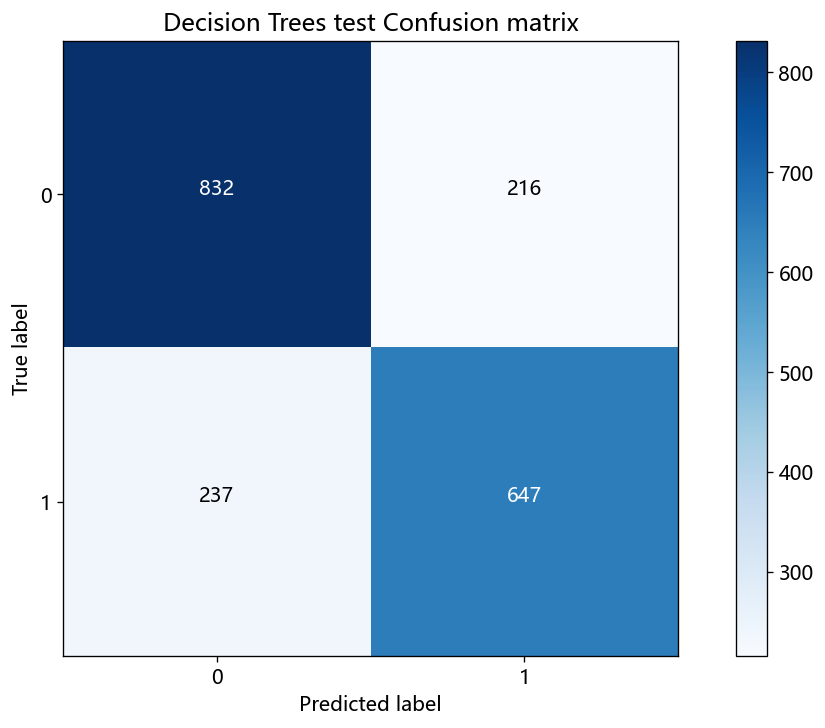

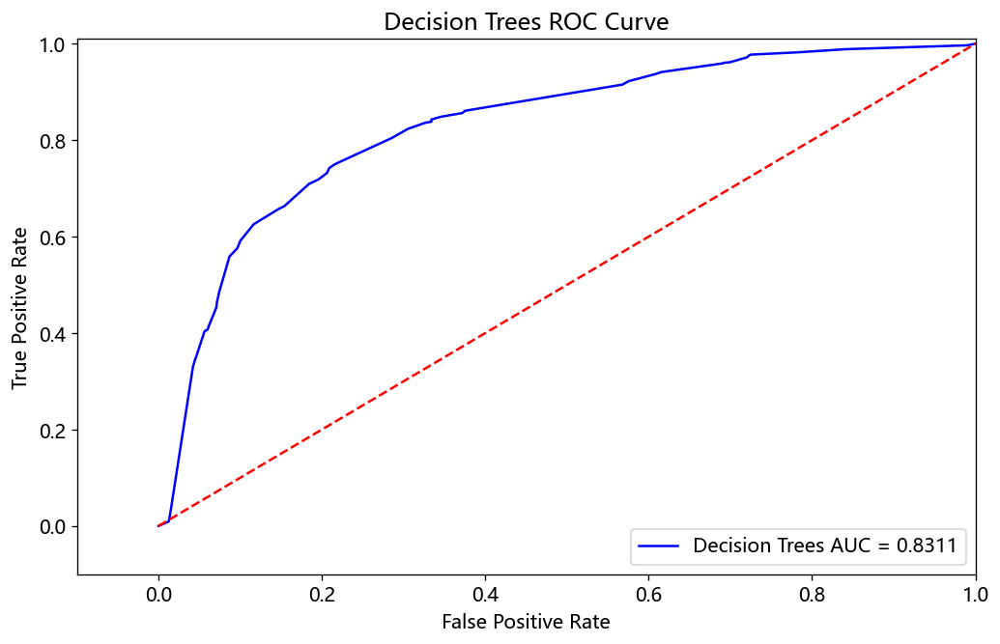

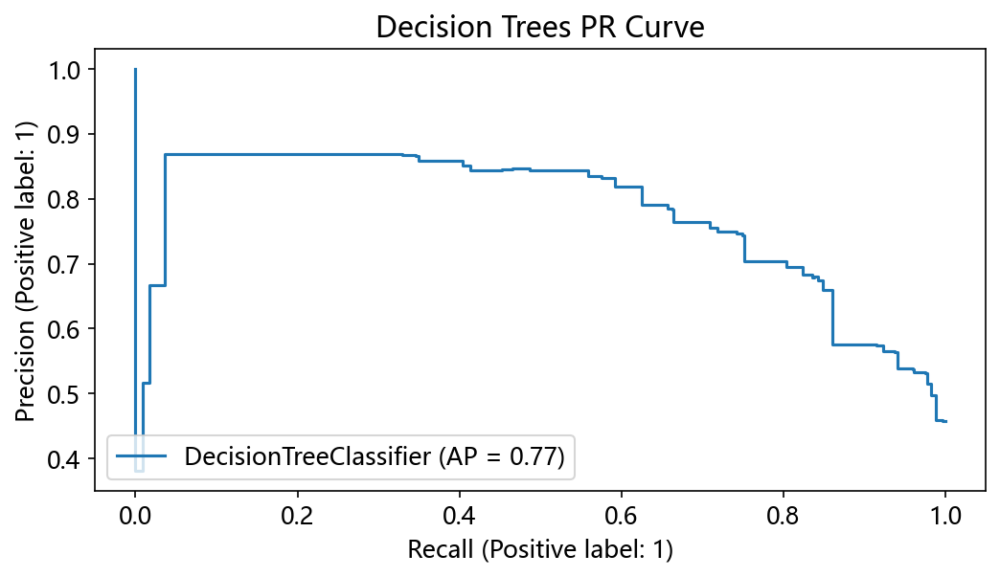

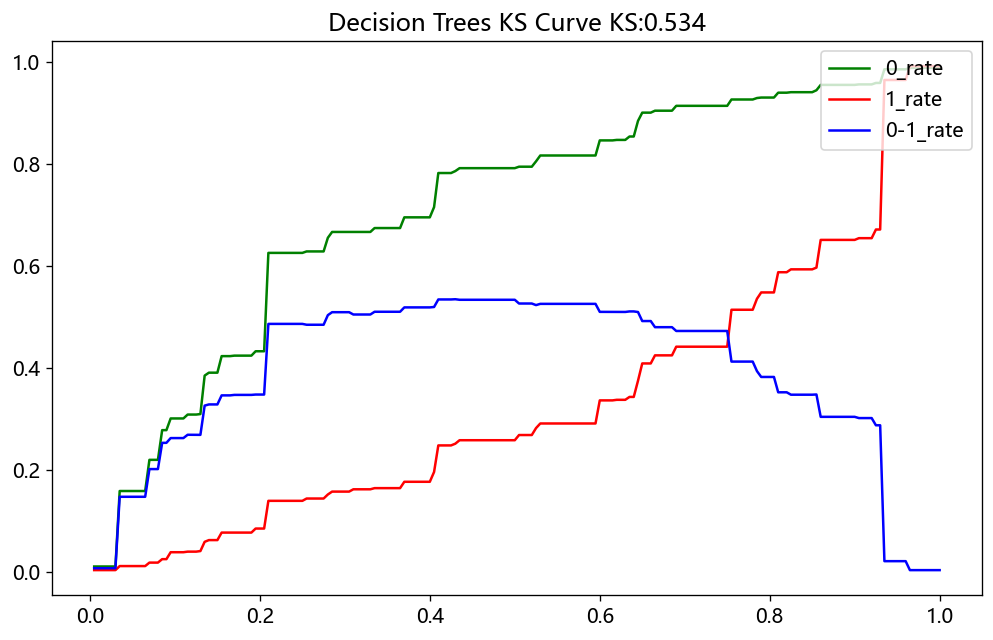

Random Forest test report: 
               precision    recall  f1-score   support

           0       0.77      0.84      0.80      1048
           1       0.79      0.71      0.74       884

    accuracy                           0.78      1932
   macro avg       0.78      0.77      0.77      1932
weighted avg       0.78      0.78      0.78      1932



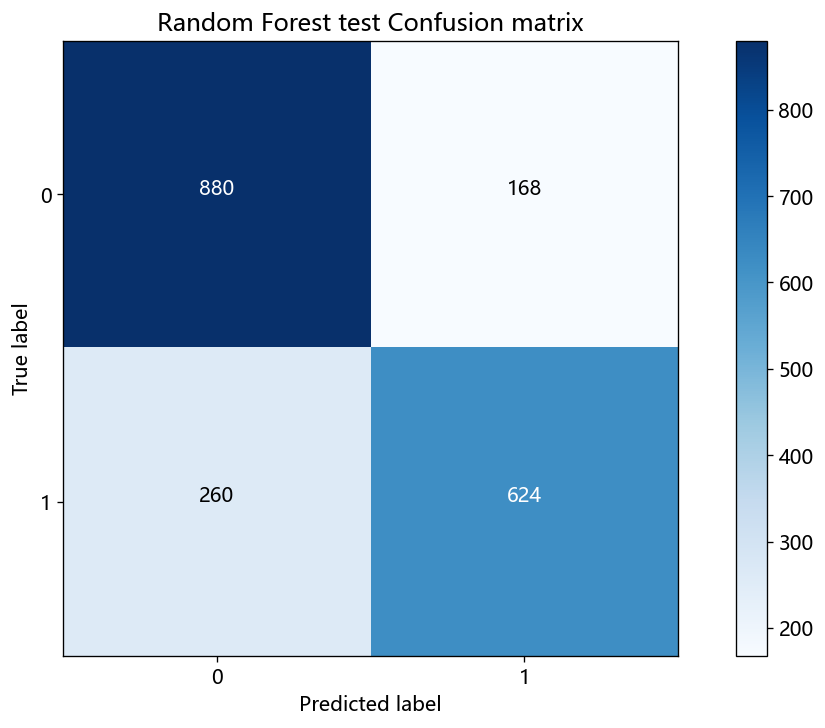

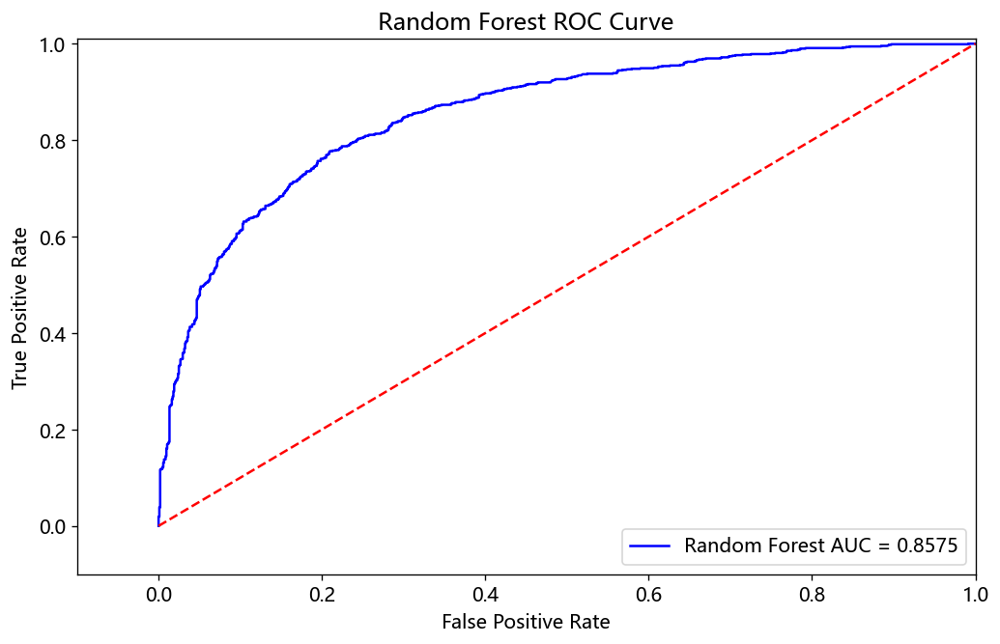

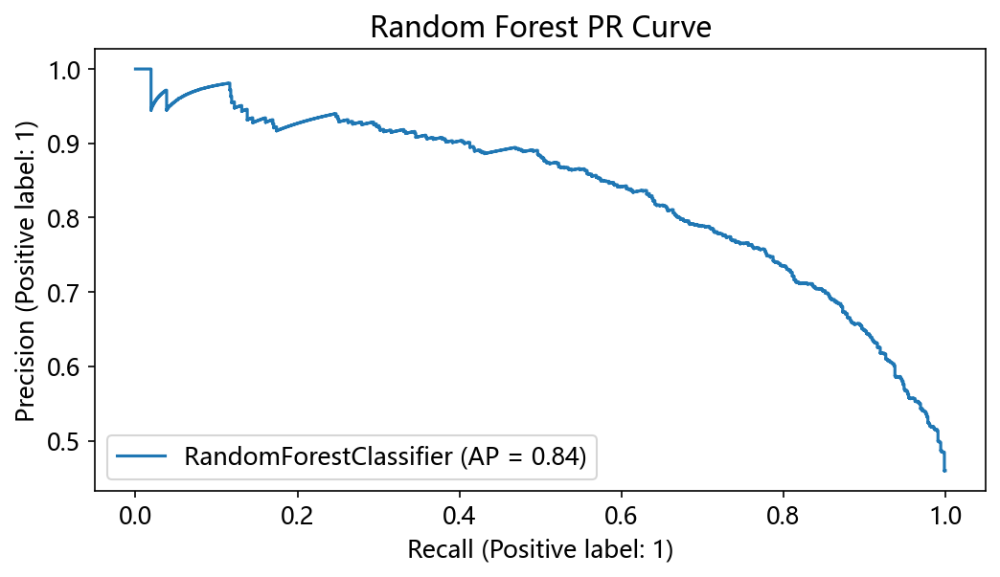

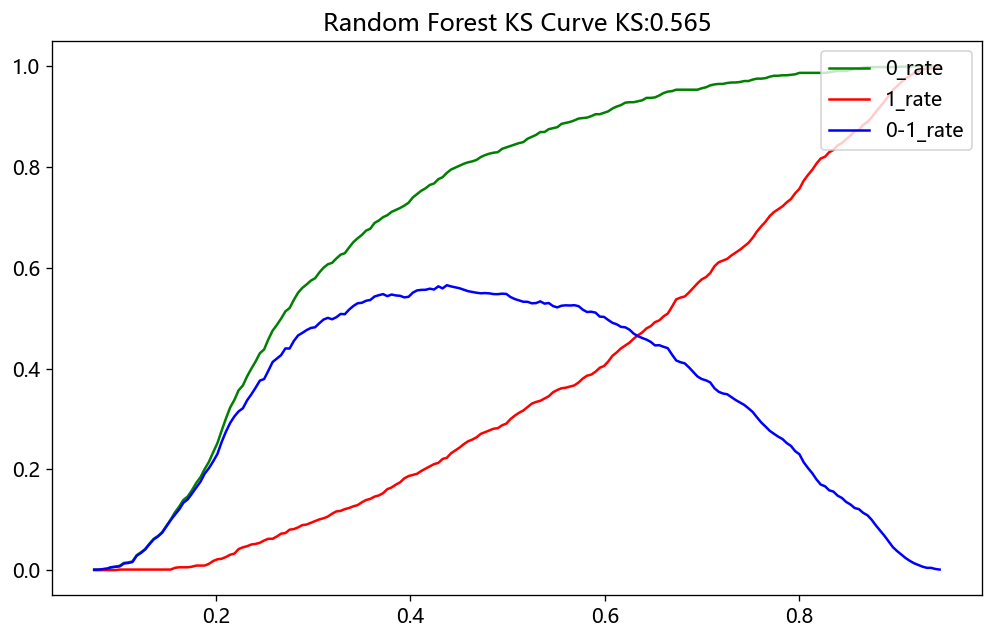

XGboost test report: 
               precision    recall  f1-score   support

           0       0.81      0.81      0.81      1048
           1       0.78      0.77      0.77       884

    accuracy                           0.79      1932
   macro avg       0.79      0.79      0.79      1932
weighted avg       0.79      0.79      0.79      1932



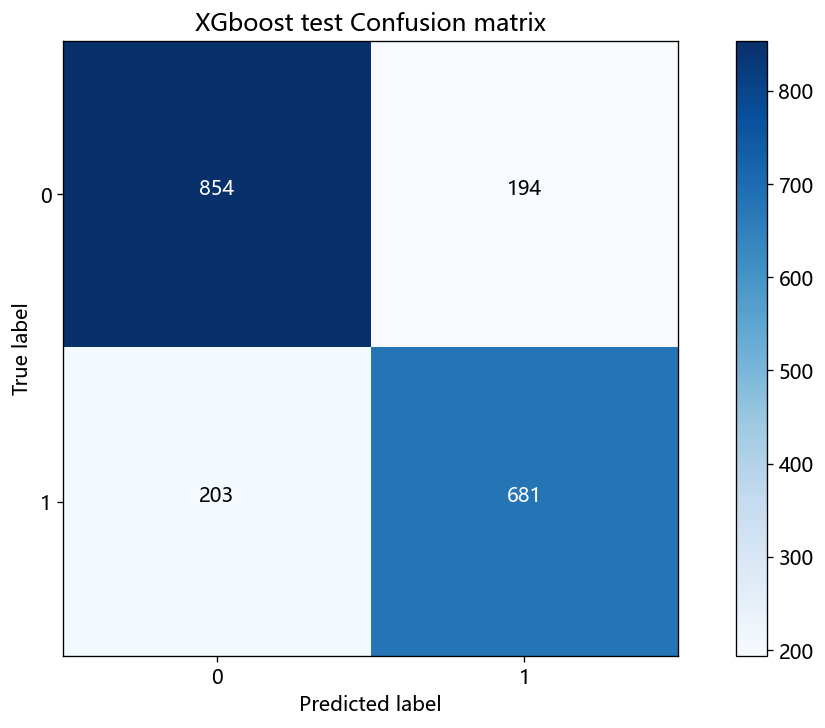

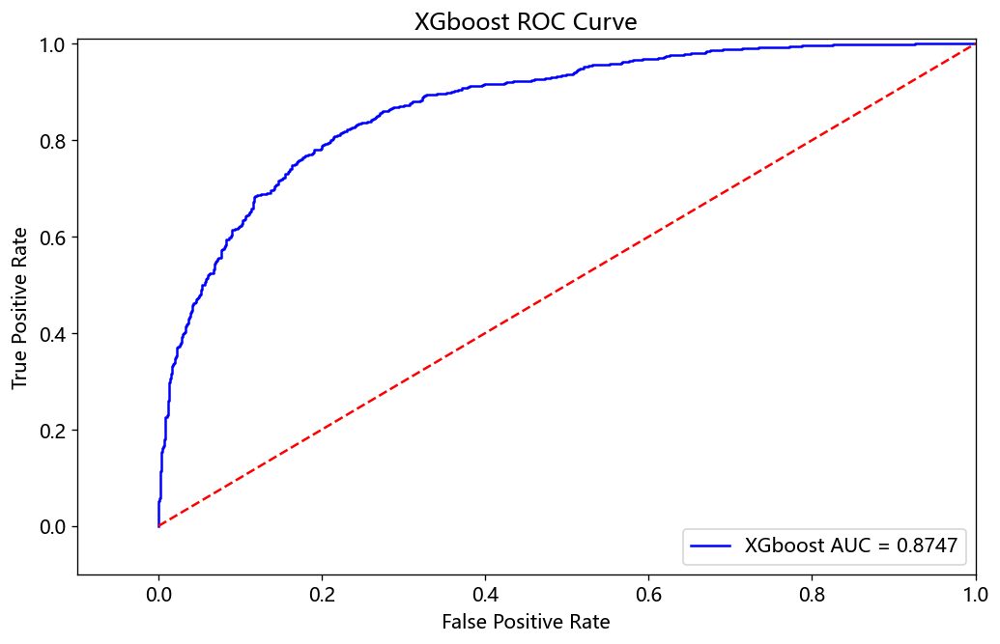

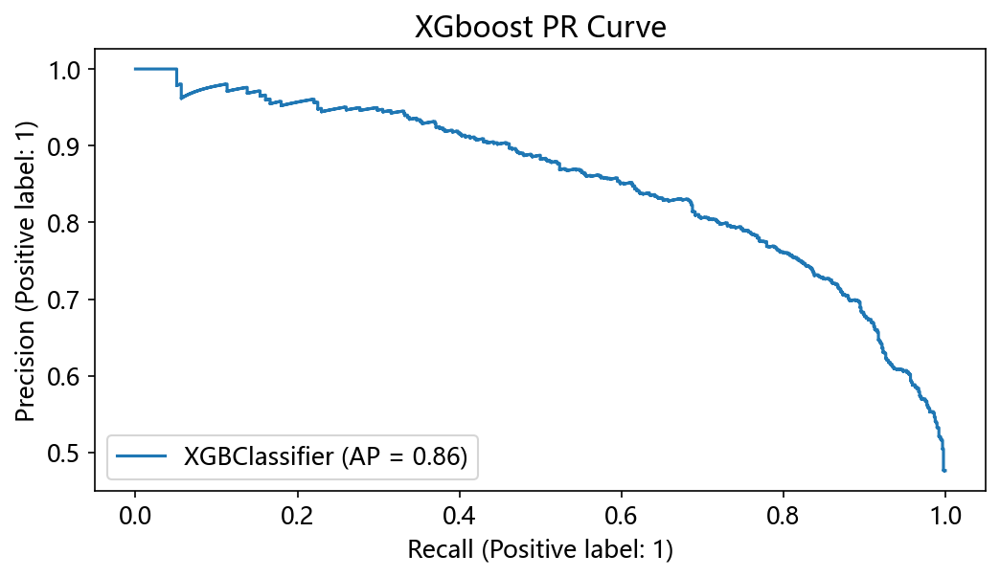

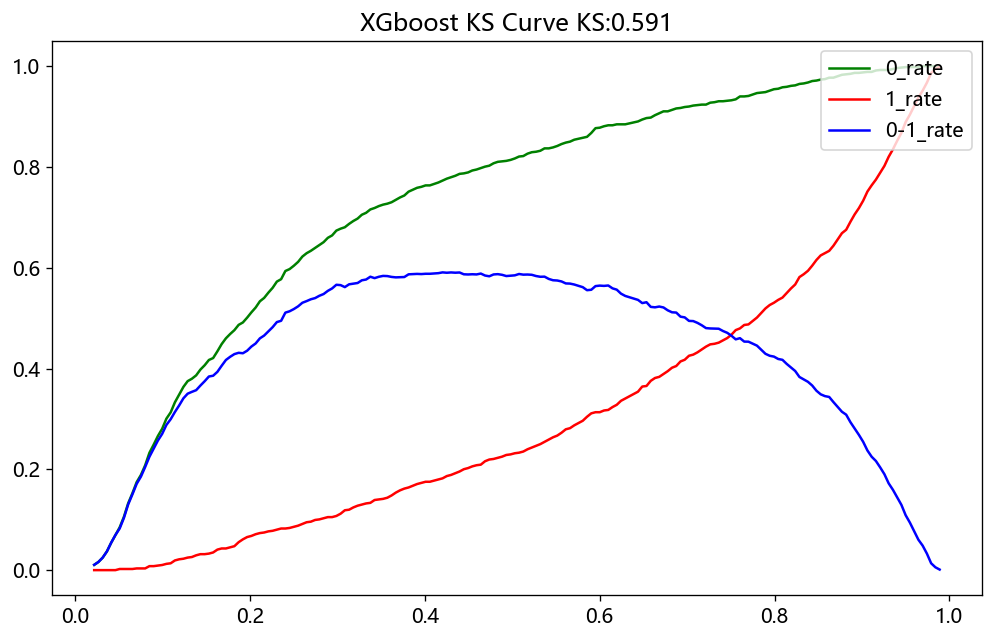

Gradient lifting tree test report: 
               precision    recall  f1-score   support

           0       0.81      0.81      0.81      1048
           1       0.78      0.77      0.77       884

    accuracy                           0.79      1932
   macro avg       0.79      0.79      0.79      1932
weighted avg       0.79      0.79      0.79      1932



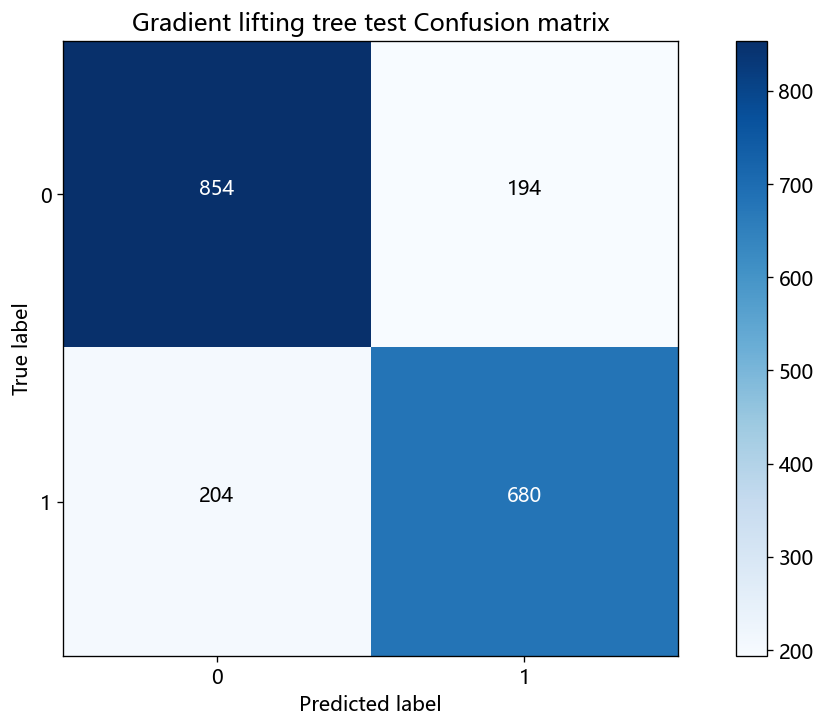

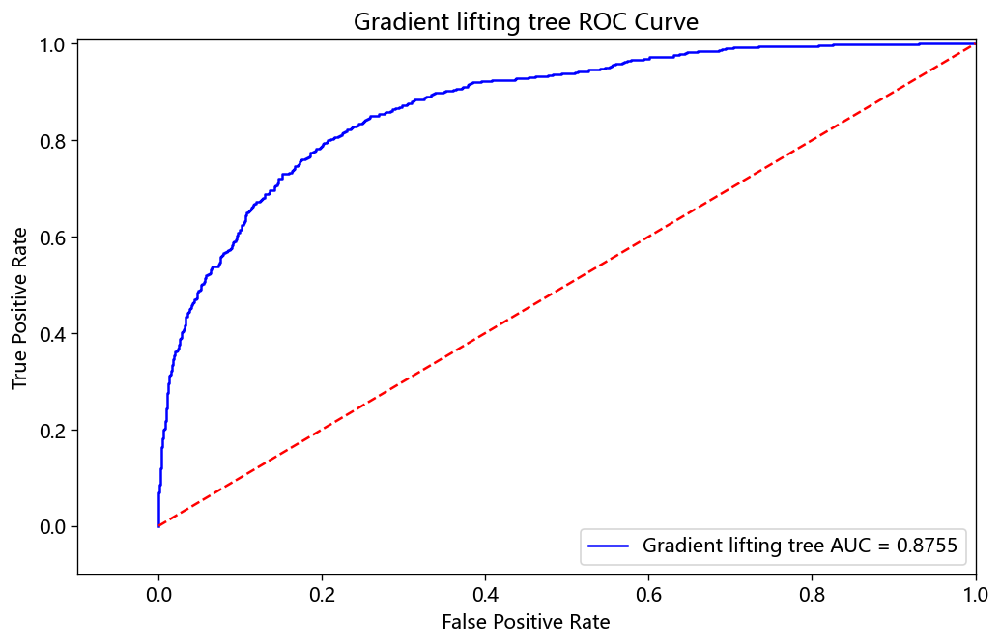

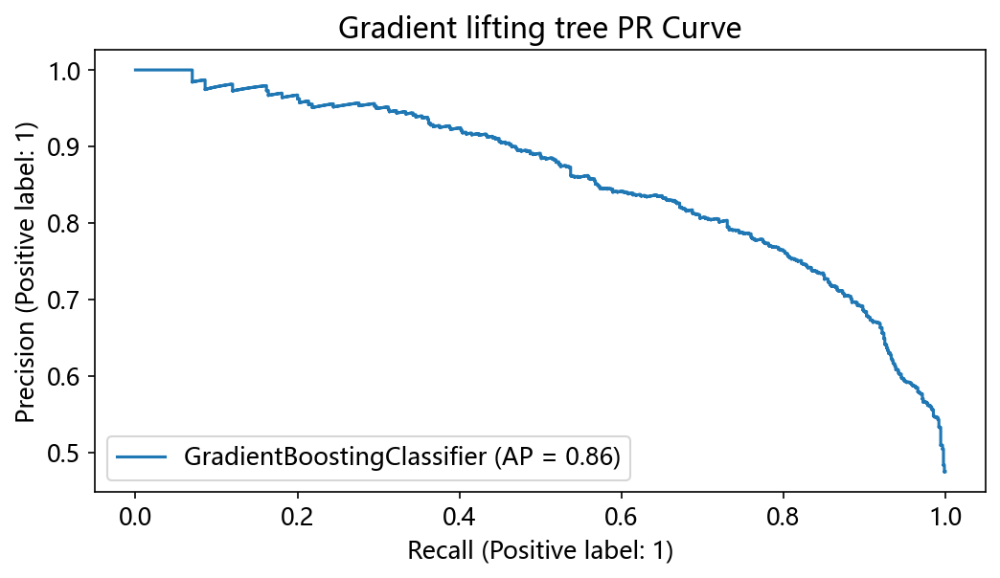

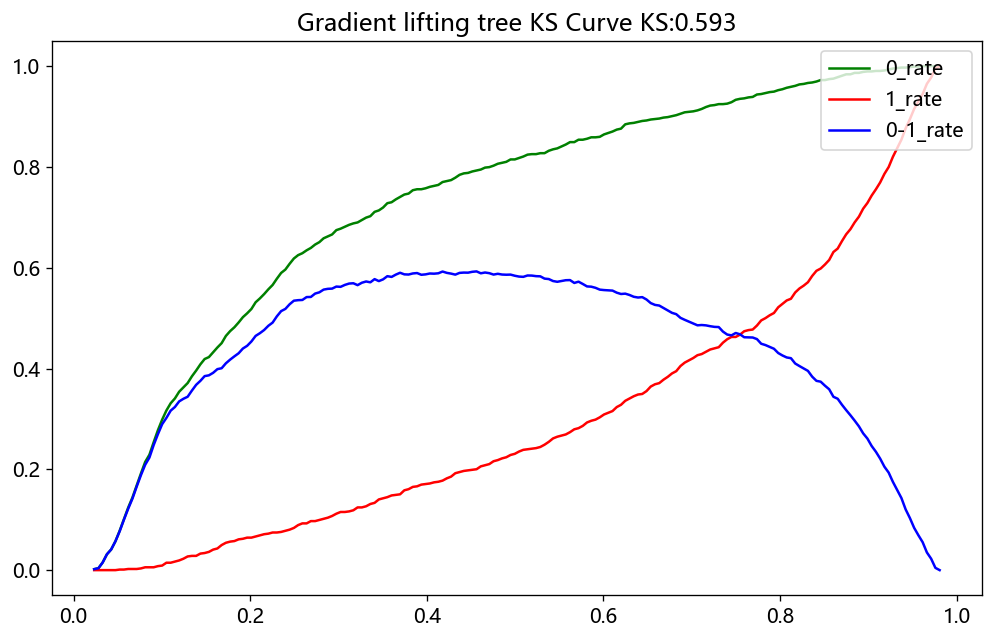

LightGBM test report: 
               precision    recall  f1-score   support

           0       0.76      0.82      0.79      1048
           1       0.76      0.69      0.72       884

    accuracy                           0.76      1932
   macro avg       0.76      0.75      0.75      1932
weighted avg       0.76      0.76      0.76      1932



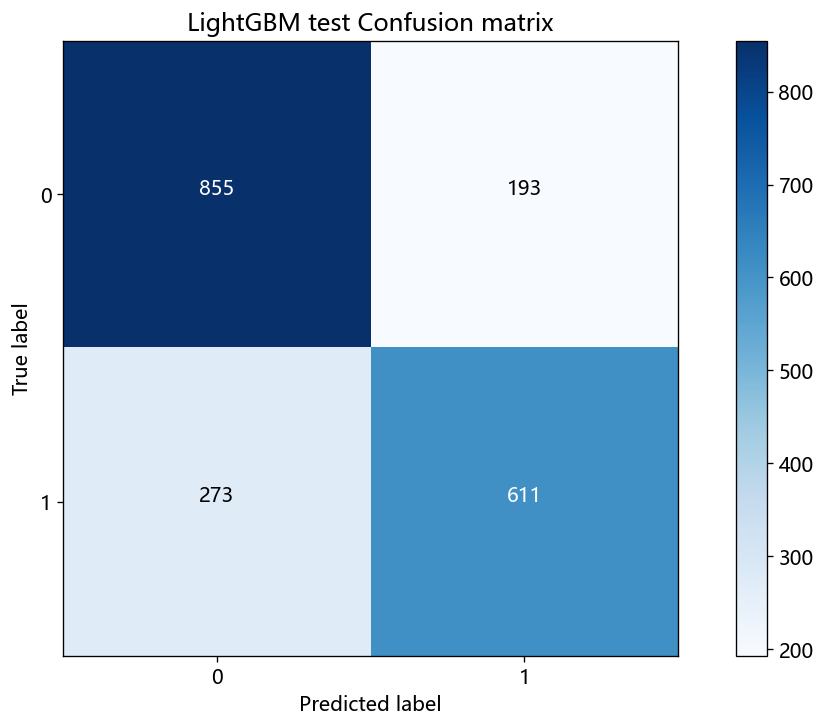

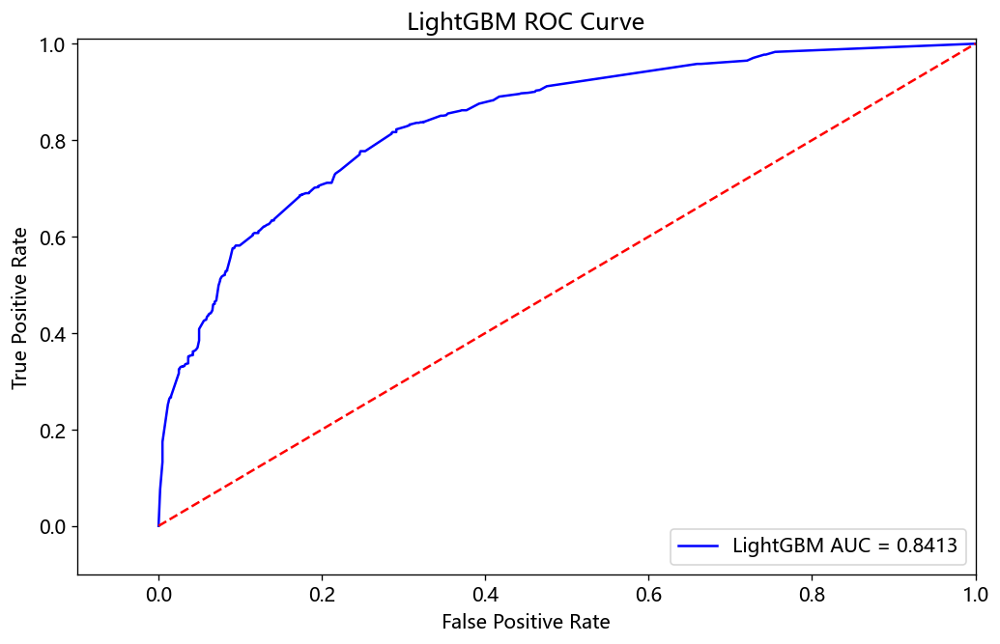

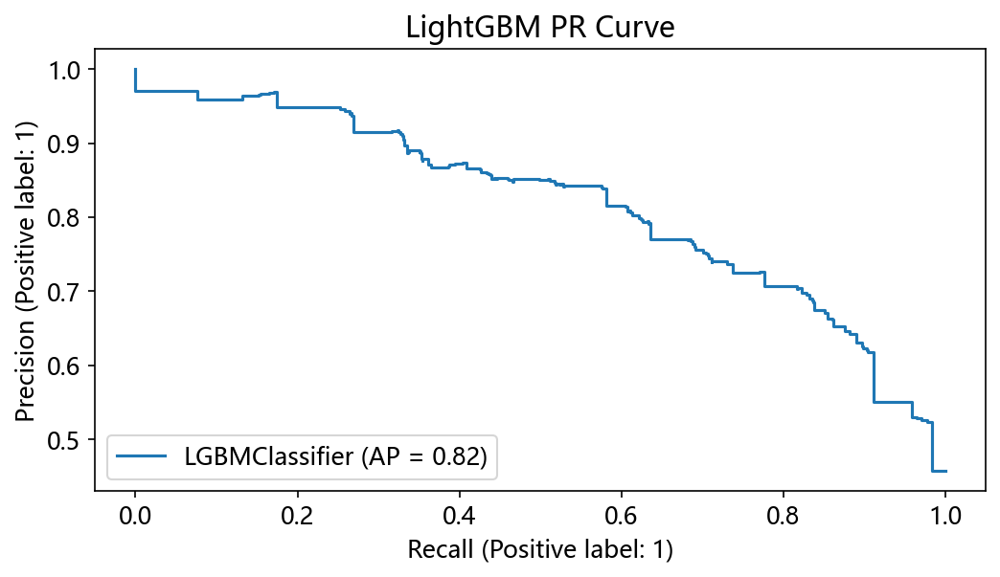

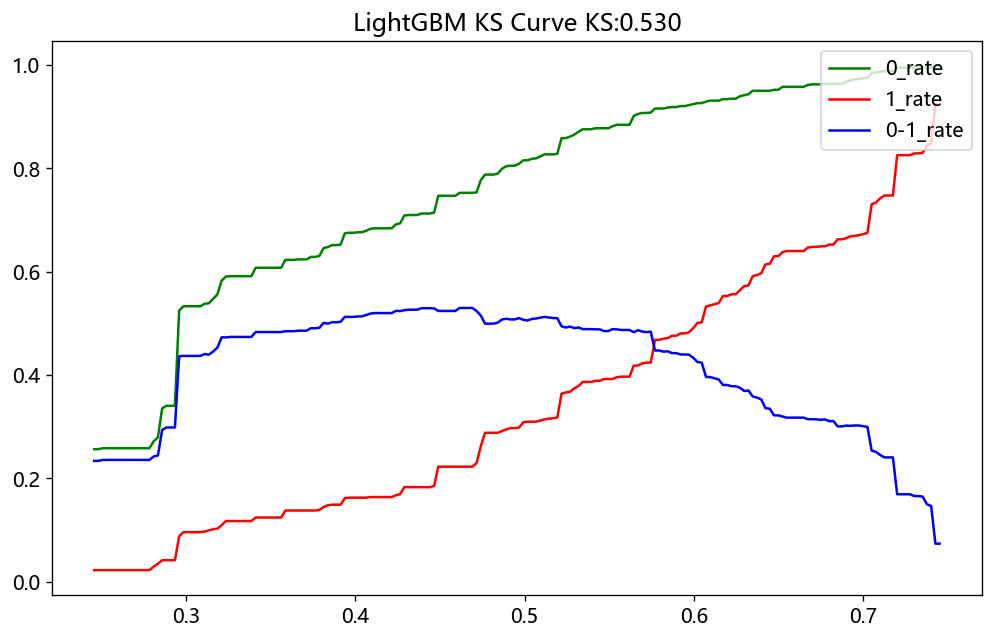

In [25]:
import itertools
def plot_roc(y_pred_undersample_score,labels_test,classifiers,color):
    fpr, tpr, thresholds = metrics.roc_curve(labels_test,y_pred_undersample_score)
    roc_auc = metrics.auc(fpr,tpr)
    plt.figure(figsize=(10,6),dpi=120)
    plt.title(classifiers+' ROC Curve')
    plt.plot(fpr, tpr, 'b',color=color,label='%s AUC = %0.4f'% (classifiers,roc_auc))
    plt.legend(loc='lower right')
    plt.plot([0,1],[0,1],'r--')
    plt.xlim([-0.1,1.0])
    plt.ylim([-0.1,1.01])
    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
def plot_confusion_matrix(cm, classes,title='Confusion matrix',cmap=plt.cm.Blues):
    plt.figure(figsize=(10,6),dpi=120)
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=0)
    plt.yticks(tick_marks, classes)
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, cm[i, j], horizontalalignment="center",color="white" if cm[i, j] > thresh else "black")
    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label')
def plot_model_ks(y_label,y_pred,title):
    """
    Plotting ks curves
    param:
        y_label -- True y-value list/array
        y_pred -- Predicted y-value list/array
    return:
       ks curve
    """
    pred_list = list(y_pred) 
    label_list = list(y_label)
    total_bad = sum(label_list)
    total_good = len(label_list)-total_bad 
    items = sorted(zip(pred_list,label_list),key=lambda x:x[0]) 
    step = (max(pred_list)-min(pred_list))/200 
    
    pred_bin=[]
    good_rate=[] 
    bad_rate=[] 
    ks_list = [] 
    for i in range(1,201): 
        idx = min(pred_list)+i*step 
        pred_bin.append(idx) 
        label_bin = [x[1] for x in items if x[0]<idx] 
        bad_num = sum(label_bin)
        good_num = len(label_bin)-bad_num  
        goodrate = good_num/total_good 
        badrate = bad_num/total_bad
        ks = abs(goodrate-badrate) 
        good_rate.append(goodrate)
        bad_rate.append(badrate)
        ks_list.append(ks)
    
    # fig = plt.figure(figsize=(6,4))
    # ax = fig.add_subplot(1,1,1)
    plt.plot(pred_bin,good_rate,color='green',label='0_rate')
    plt.plot(pred_bin,bad_rate,color='red',label='1_rate')
    plt.plot(pred_bin,ks_list,color='blue',label='0-1_rate')
    plt.title(title+' KS:{:.3f}'.format(max(ks_list)))
    plt.legend(loc=1)
    # return plt.show(ax)
for name,model in zip(['Decision Trees','Random Forest','XGboost','Gradient lifting tree','LightGBM'],[model_DT1,model_RF1,model_XGB1,model_GBDT1,model_LGB1]):
    y_test = y_test.reset_index(drop = True)
    y_predict1 = model.predict(x_test[f_top])
    y_predict2 = model.predict_proba(x_test[f_top])[:,1]
    cnf_matrix=metrics.confusion_matrix(y_test,y_predict1)
    print('%s test report: \n'%name,metrics.classification_report(y_test,y_predict1))
    plot_confusion_matrix(cnf_matrix,[0,1],title='%s test Confusion matrix'%name,cmap=plt.cm.Blues)
    plt.show()
    plot_roc(y_predict2,y_test,name,'blue')
    plt.show()
    metrics.plot_precision_recall_curve(model, x_test[f_top], y_test) 
    fig = plt.gcf()
    fig.set_size_inches(8,4)
    plt.title(name + ' PR Curve')
    plt.show()
    plt.figure(figsize=(10,6),dpi=120)
    plot_model_ks(y_test,y_predict2,name+' KS Curve')
    plt.show()

Decision Trees Importance of variables


,variables,Importance
19,opinion_seas_risk,0.533050
18,opinion_seas_vacc_effective,0.152325
10,doctor_recc_seasonal,0.107988
32,employment_industry,0.029495
33,employment_occupation,0.026772
25,income_poverty,0.025950
14,health_insurance,0.019807
23,race,0.018668
21,age_group,0.016914
22,education,0.011545


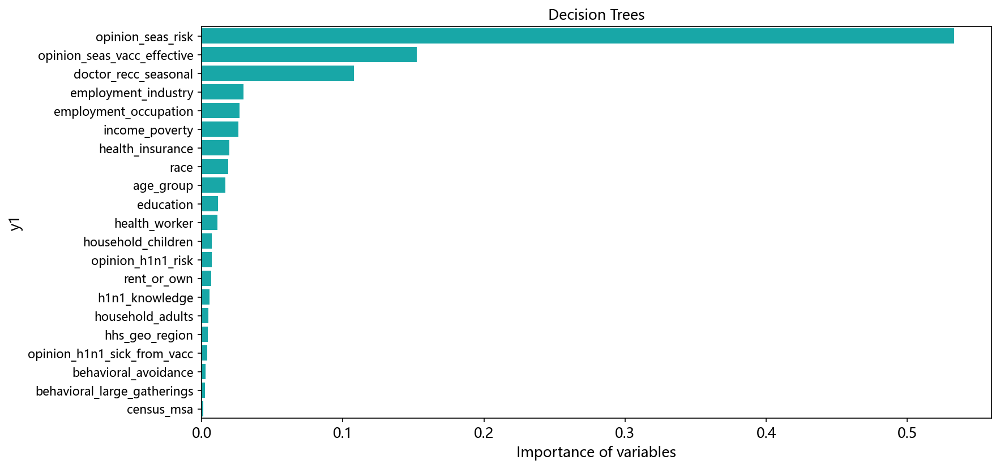

Random Forest Importance of variables


,variables,Importance
19,opinion_seas_risk,0.336119
16,opinion_h1n1_risk,0.117556
10,doctor_recc_seasonal,0.106337
18,opinion_seas_vacc_effective,0.092165
21,age_group,0.055639
15,opinion_h1n1_vacc_effective,0.045542
32,employment_industry,0.031444
33,employment_occupation,0.023203
13,health_worker,0.022911
14,health_insurance,0.019609


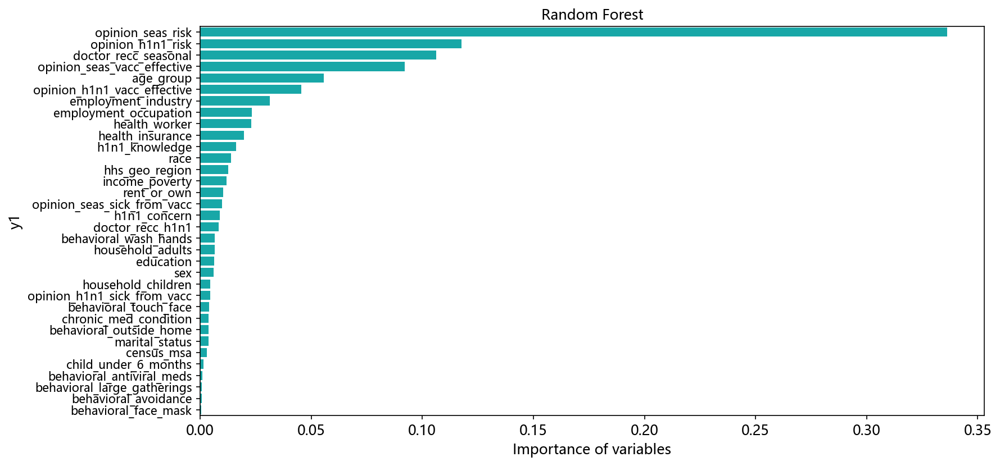

XGboost Importance of variables


,variables,Importance
19,opinion_seas_risk,0.229408
18,opinion_seas_vacc_effective,0.091708
10,doctor_recc_seasonal,0.085681
13,health_worker,0.057890
14,health_insurance,0.044462
1,h1n1_knowledge,0.043671
27,rent_or_own,0.040219
21,age_group,0.036975
25,income_poverty,0.030299
23,race,0.024626


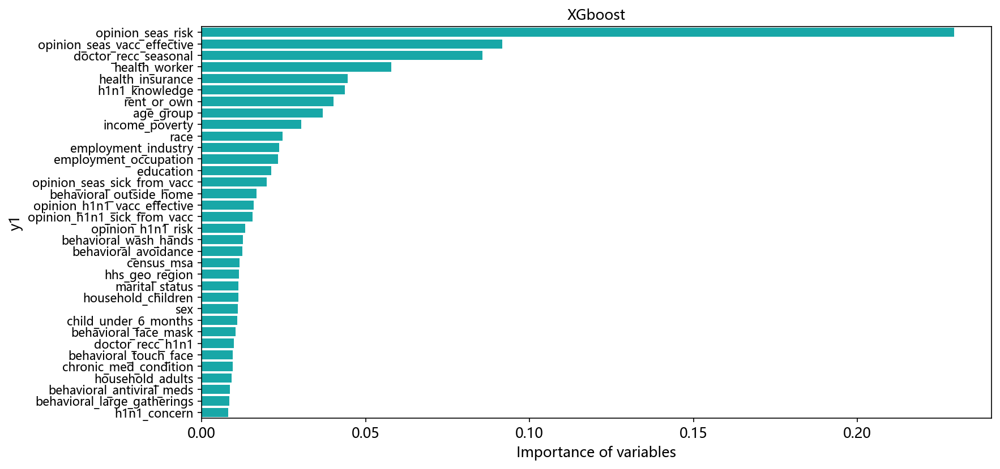

Gradient lifting tree Importance of variables


,variables,Importance
19,opinion_seas_risk,0.471428
18,opinion_seas_vacc_effective,0.159868
10,doctor_recc_seasonal,0.099718
33,employment_occupation,0.039794
21,age_group,0.039043
1,h1n1_knowledge,0.022606
32,employment_industry,0.021949
14,health_insurance,0.019039
13,health_worker,0.017301
27,rent_or_own,0.016139


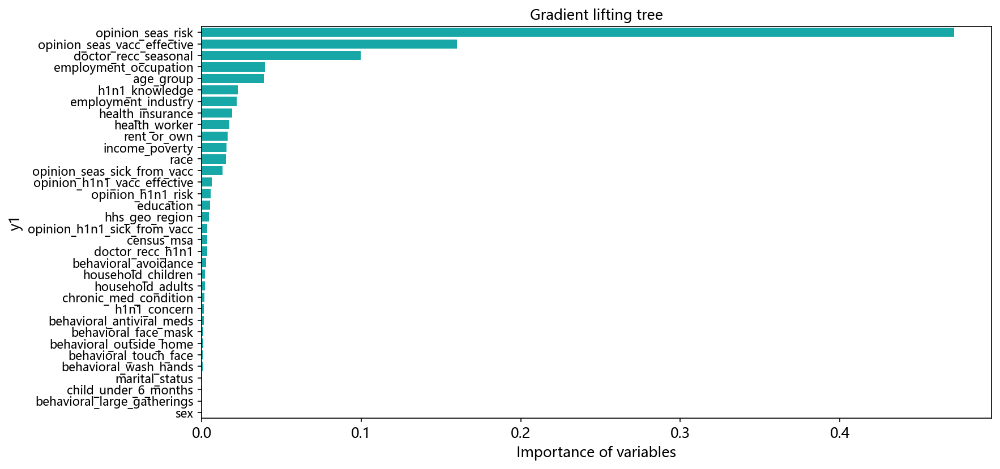

LightGBM Importance of variables


,variables,Importance
18,opinion_seas_vacc_effective,193
19,opinion_seas_risk,170
10,doctor_recc_seasonal,124
21,age_group,34
23,race,34
14,health_insurance,31
27,rent_or_own,30
33,employment_occupation,27
25,income_poverty,25
1,h1n1_knowledge,23


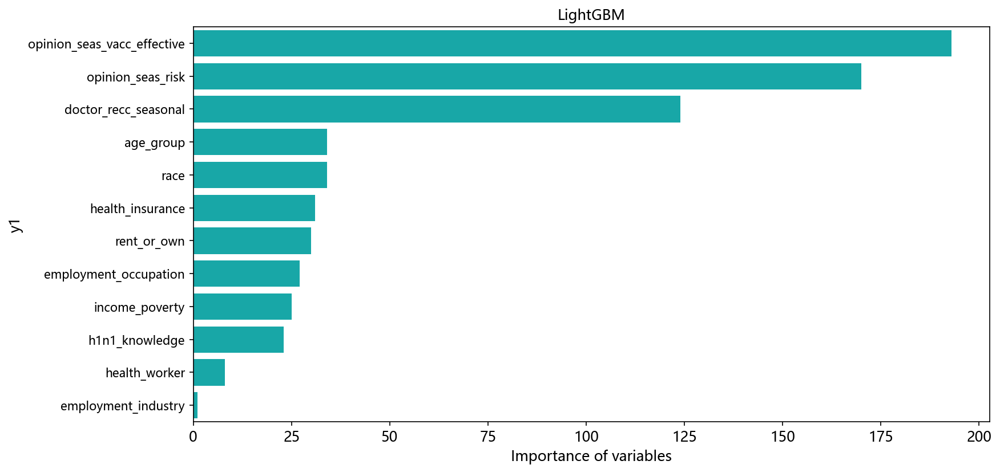

In [26]:
#variableimportance
for name,model in zip(['Decision Trees','Random Forest','XGboost','Gradient lifting tree','LightGBM'],[model_DT1,model_RF1,model_XGB1,model_GBDT1,model_LGB1]):
    print(name,'Importance of variables')
    model.fit(x_train,y_train)
    tmp=pd.DataFrame({'variables':x_train.columns.tolist(),'Importance':model.feature_importances_})
    tmp=tmp[tmp.Importance>0]
    tmp=tmp.sort_values(by='Importance',ascending=False)
    display(tmp.style.background_gradient(cmap='RdPu'))
    plt.figure(figsize = (12,6))
    sns.barplot(y=tmp.variables,x=tmp.Importance,color='c')
    plt.xlabel('Importance of variables',fontsize=12)
    plt.yticks(fontsize=10)
    plt.ylabel('y1',fontsize=12)
    plt.title(name,fontsize=12)
    plt.show()

In [27]:
len(x_train.columns.tolist())

34

In [28]:
## Filter variables based on xgb variable importance - 12 reserved
tmp=pd.DataFrame({'variables':x_train.columns.tolist(),'Importance':model_XGB1.feature_importances_}).sort_values(by='Importance',ascending=False)
f_top=tmp.head(12).variables.tolist()#Variable after reservation
tmp.head(12)

,variables,Importance
19,opinion_seas_risk,0.229408
18,opinion_seas_vacc_effective,0.091708
10,doctor_recc_seasonal,0.085681
13,health_worker,0.057890
14,health_insurance,0.044462
1,h1n1_knowledge,0.043671
27,rent_or_own,0.040219
21,age_group,0.036975
25,income_poverty,0.030299
23,race,0.024626


In [29]:
f_top

['opinion_seas_risk',
 'opinion_seas_vacc_effective',
 'doctor_recc_seasonal',
 'health_worker',
 'health_insurance',
 'h1n1_knowledge',
 'rent_or_own',
 'age_group',
 'income_poverty',
 'race',
 'employment_industry',
 'employment_occupation']

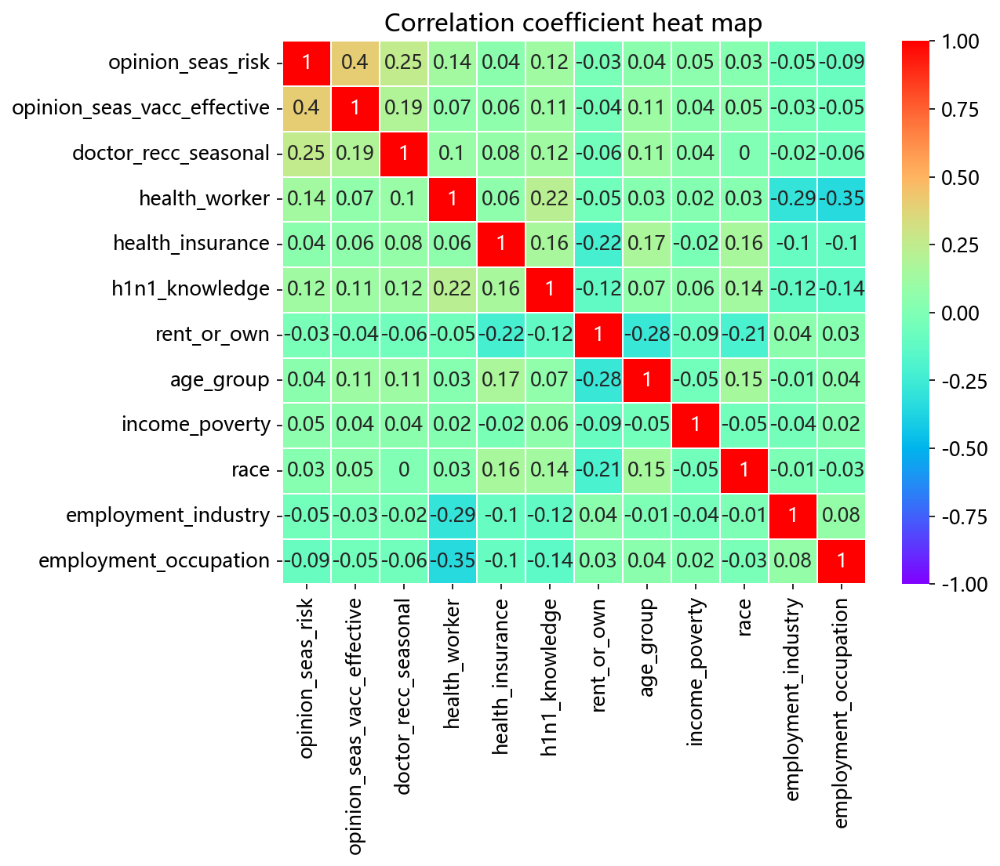

In [30]:
# Draw a heat map where the value is the correlation coefficient between two variables, from which you can see the correlation (positive or negative) between each variable and the magnitude of the correlation.
plt.figure(figsize=(8,6))
cov = data[f_top].corr(method='spearman').round(2)
sns.heatmap(cov,cmap='rainbow',annot=True,linewidths=0.1,vmin=-1,)
plt.title('Correlation coefficient heat map',size=15)
plt.savefig('Correlation coefficient heat map.png',dpi=300,bbox_inches = 'tight')
cov.to_csv('Correlation coefficient.csv',index=False)

In [31]:
# XGB-Bayesian Tuning
from sklearn.linear_model import BayesianRidge
from skopt import BayesSearchCV 
from skopt.space import Real, Categorical, Integer
opt = BayesSearchCV(xgb.XGBClassifier(verbosity=0,
                              n_jobs=-1,
                                random_state=2022), 
                    { 
                    'max_depth': Integer(3, 5), 
                    'n_estimators': Integer(100, 300), 
                    'learning_rate': (0.1, 0.3)},
                    random_state=2022,
                    n_iter=20,
                    cv=3)
opt.fit(x_train, y_train)
print(f'best params: {opt.best_params_}')

best params: OrderedDict([('learning_rate', 0.1), ('max_depth', 3), ('n_estimators', 300)])


In [32]:
# BYSXGB
BYSXGB = xgb.XGBClassifier(verbosity=0,
                            n_jobs=-1,
                            random_state=2022,
                             max_depth=3,
                               n_estimators=100,
                            learning_rate= 0.1,
                     )
print('The BYSXGB model scores are as follows：')
try_different_method(BYSXGB,f_top)

The BYSXGB model scores are as follows：
Training set evaluation metrics：
The accuracy rate is:  0.8133 AUC values are:  0.8922 KS values are:  0.6297 F1 values are:  0.8128 Accuracy rate of:  0.8133 The recall rate is:  0.8133
Test set evaluation indicators：
The accuracy rate is:  0.7945 AUC values are:  0.8715 KS values are:  0.5964 F1 values are:  0.7944 Accuracy rate of:  0.7944 The recall rate is:  0.7945




# 4.SHAP

In [33]:
# BSXGB
import matplotlib.pyplot as plt
plt.rcParams['figure.dpi'] = 300 
import shap # 0.39.0
shap.initjs()
explainer = shap.Explainer(BYSXGB) 
shap_values = explainer(x_test[f_top])# Input test set characteristics

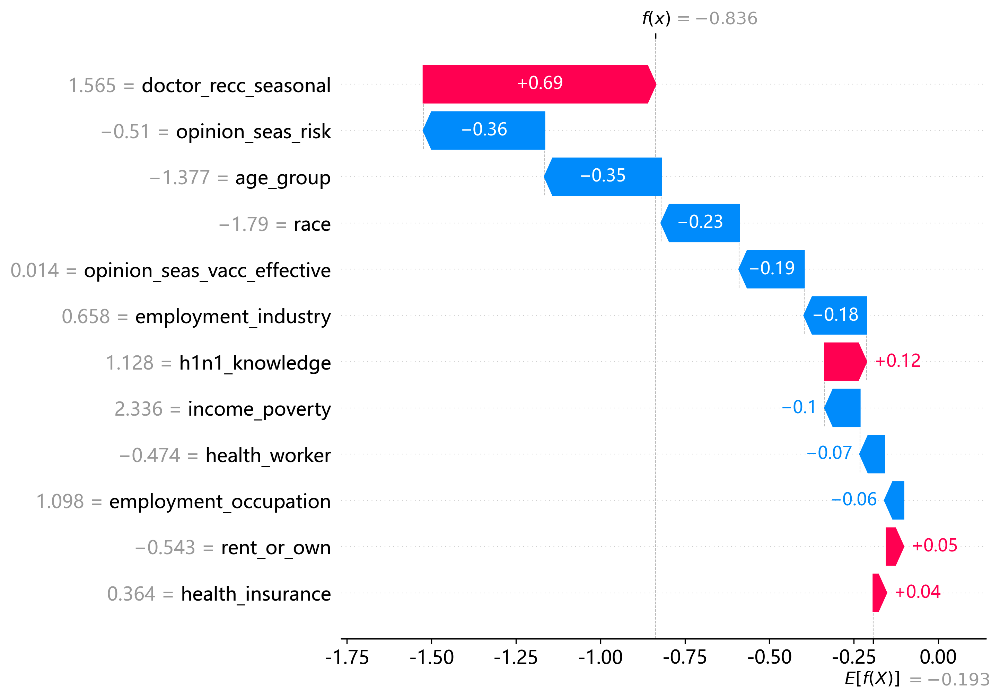

In [34]:
# [micro] Single-sample feature impact map I: waterfall
shap.plots.waterfall(shap_values[1],max_display=15) #2 sample of the test set

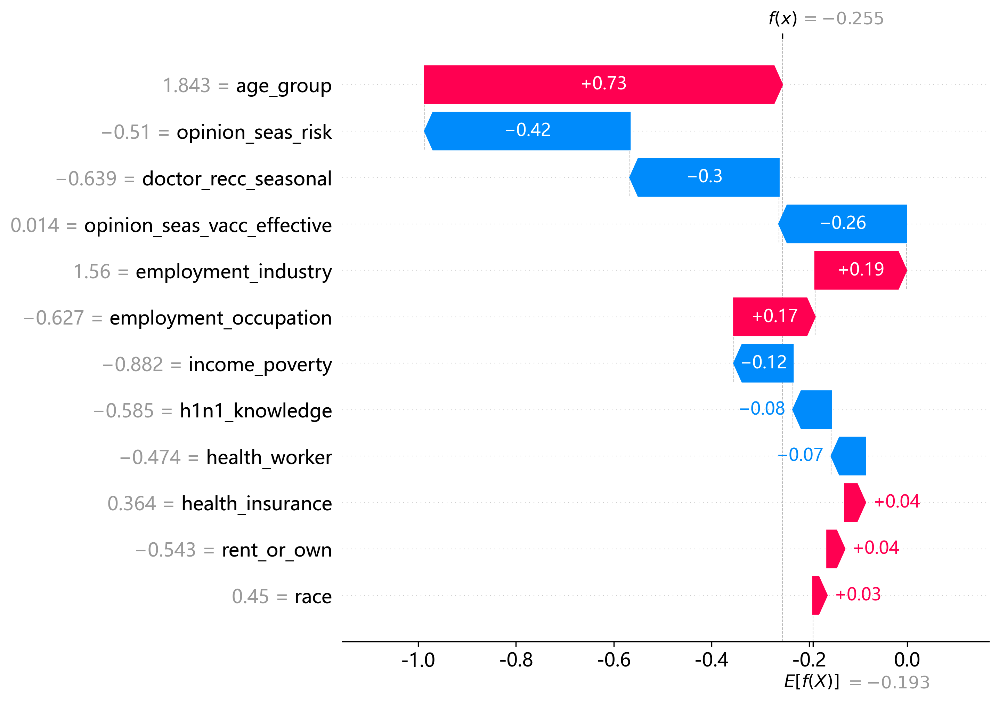

In [35]:
# [micro] Single-sample feature impact map I: waterfall
shap.plots.waterfall(shap_values[3],max_display=15)#4 sample of the test set

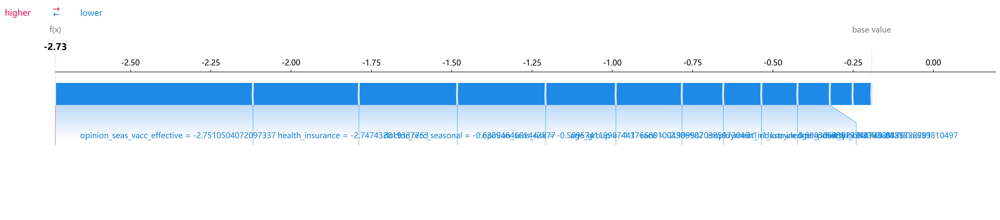

In [36]:
# force plot, [micro] single sample feature impact plot II: force plot
shap.plots.force(shap_values[9],matplotlib=True,figsize=(26, 4))#10 sample of the test set

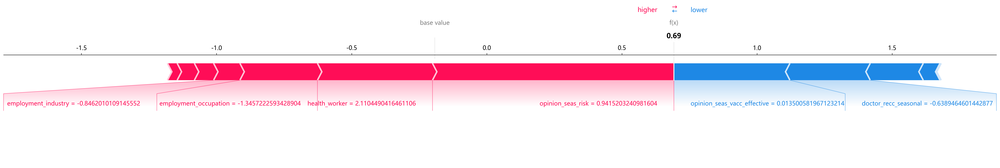

In [37]:
# force plot, [micro] single sample feature impact plot II: force plot
shap.plots.force(shap_values[0],matplotlib=True,figsize=(36, 4))# 1 sample of the test set

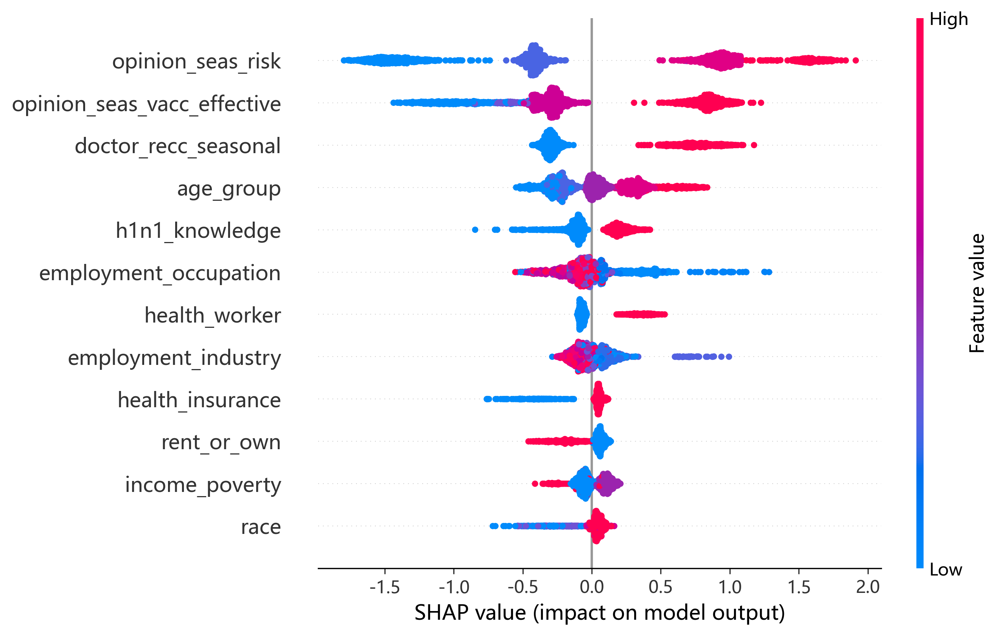

In [38]:
# [macro] Feature density scatter plot: beeswarm
shap.plots.beeswarm(shap_values,max_display=15)

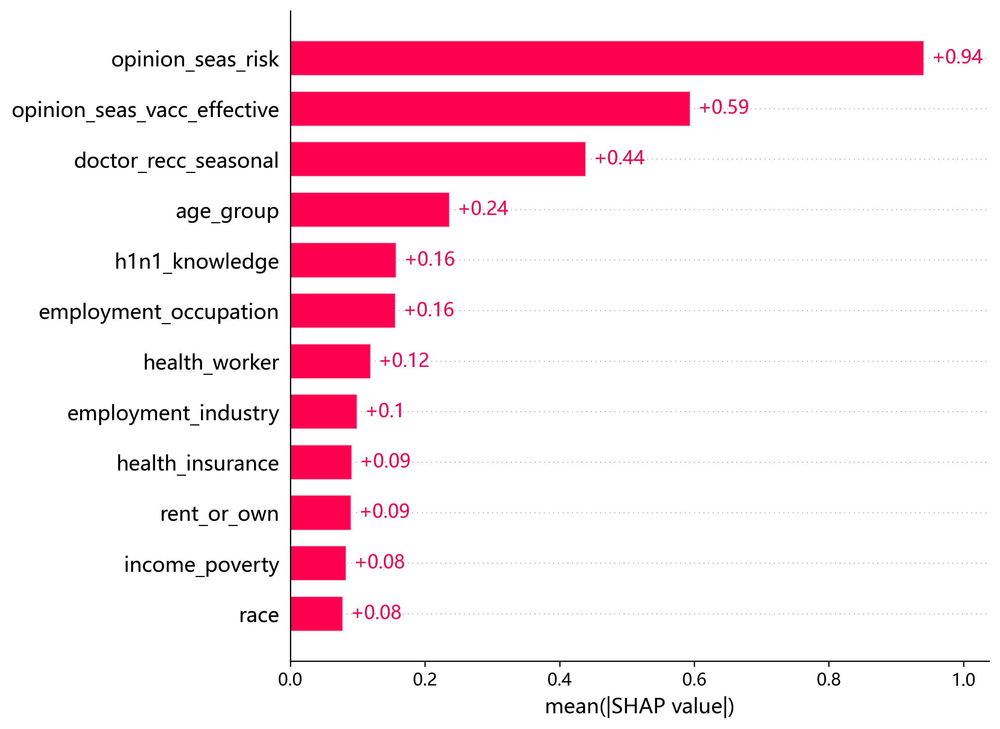

In [39]:
# [macro] feature importance SHAP values
shap.plots.bar(shap_values,max_display=15)

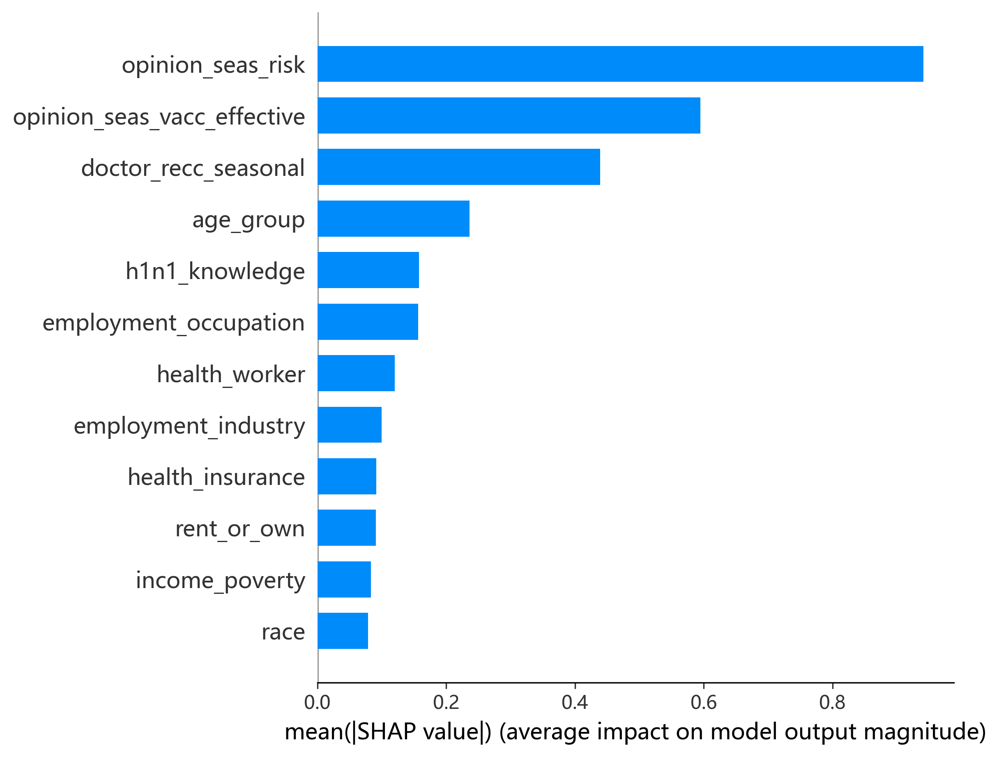

In [40]:
# Summary
shap.summary_plot(shap_values, x_test[f_top],plot_type="bar", show = False,max_display=12)

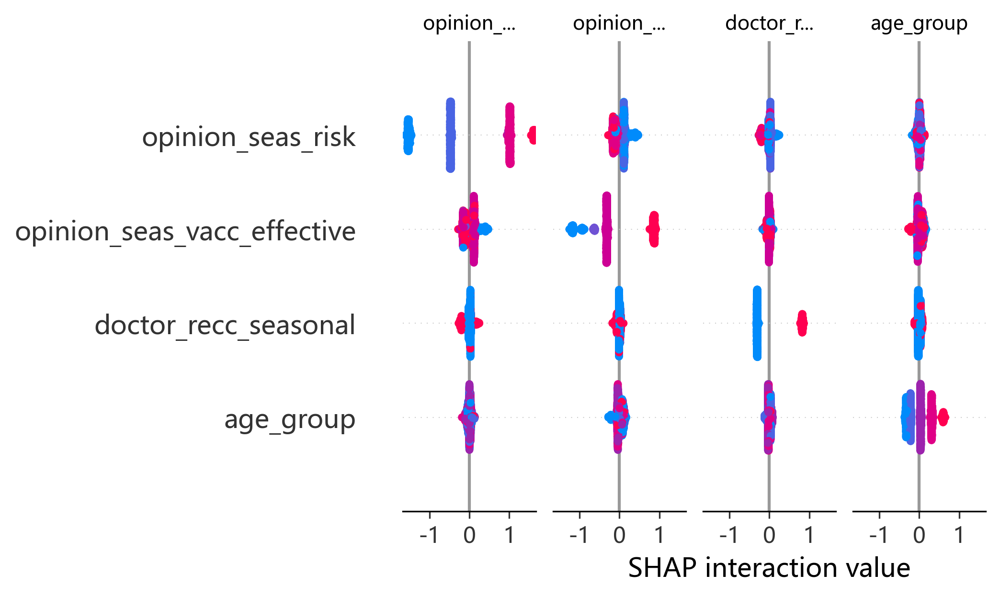

In [41]:
# Interaction diagram
plt.rcParams.update({'font.size': 8}) 
shap.summary_plot(explainer.shap_interaction_values(x_test[f_top]), x_test[f_top], show = False,max_display=4)
plt.tight_layout()
plt.show()

In [42]:
x_test[f_top].head()

,opinion_seas_risk,opinion_seas_vacc_effective,doctor_recc_seasonal,health_worker,health_insurance,h1n1_knowledge,rent_or_own,age_group,income_poverty,race,employment_industry,employment_occupation
0,0.941520,0.013501,-0.638946,2.110449,0.363976,-0.585197,-0.542716,0.233378,-0.881898,0.450497,-0.846201,-1.345722
1,-0.509574,0.013501,1.565076,-0.473833,0.363976,1.127807,-0.542716,-1.376680,2.336369,-1.789559,0.657897,1.097840
2,-1.235121,-1.829533,1.565076,2.110449,0.363976,1.127807,1.842586,-0.571651,-0.881898,0.450497,-0.846201,-1.345722
3,-0.509574,0.013501,-0.638946,-0.473833,0.363976,-0.585197,-0.542716,1.843436,-0.881898,0.450497,1.560355,-0.627027
4,-0.509574,0.013501,-0.638946,-0.473833,0.363976,-0.585197,-0.542716,-1.376680,0.727235,-2.909587,-0.846201,-1.345722


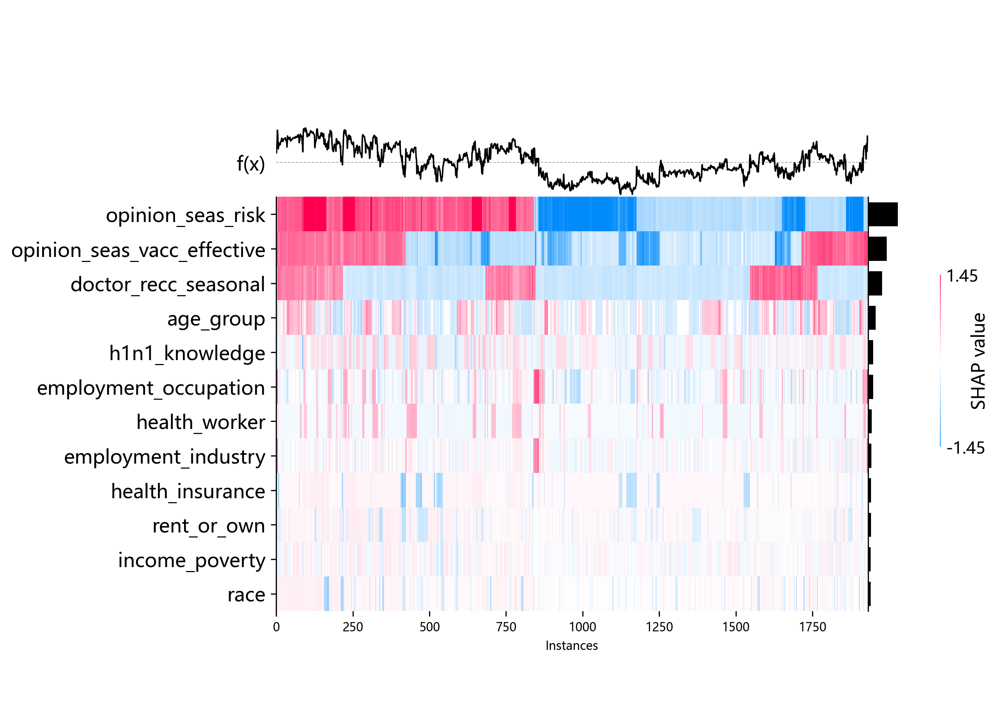

In [43]:
# Heatmap
shap.plots.heatmap(shap_values, show = False,max_display=20)

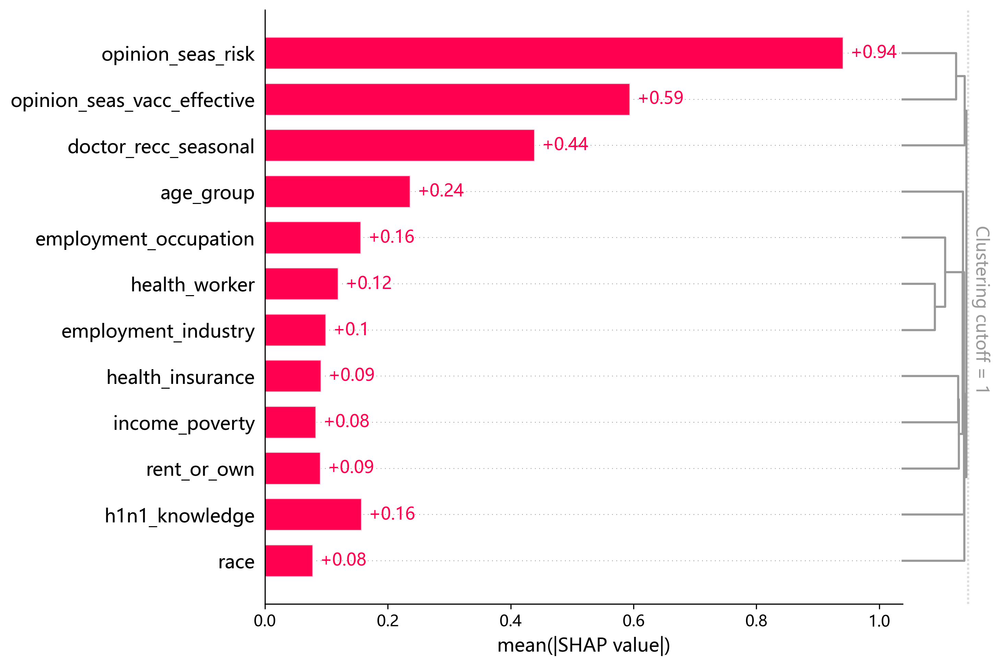

In [44]:
# Hierarchical clustering + SHAP values
clust = shap.utils.hclust(x_test[f_top], y_test)
shap.plots.bar(shap_values, clustering=clust, clustering_cutoff=1,max_display=20)

In [45]:
# Motion picture
shap.plots.force(explainer.expected_value,shap_values.values,shap_values.data)

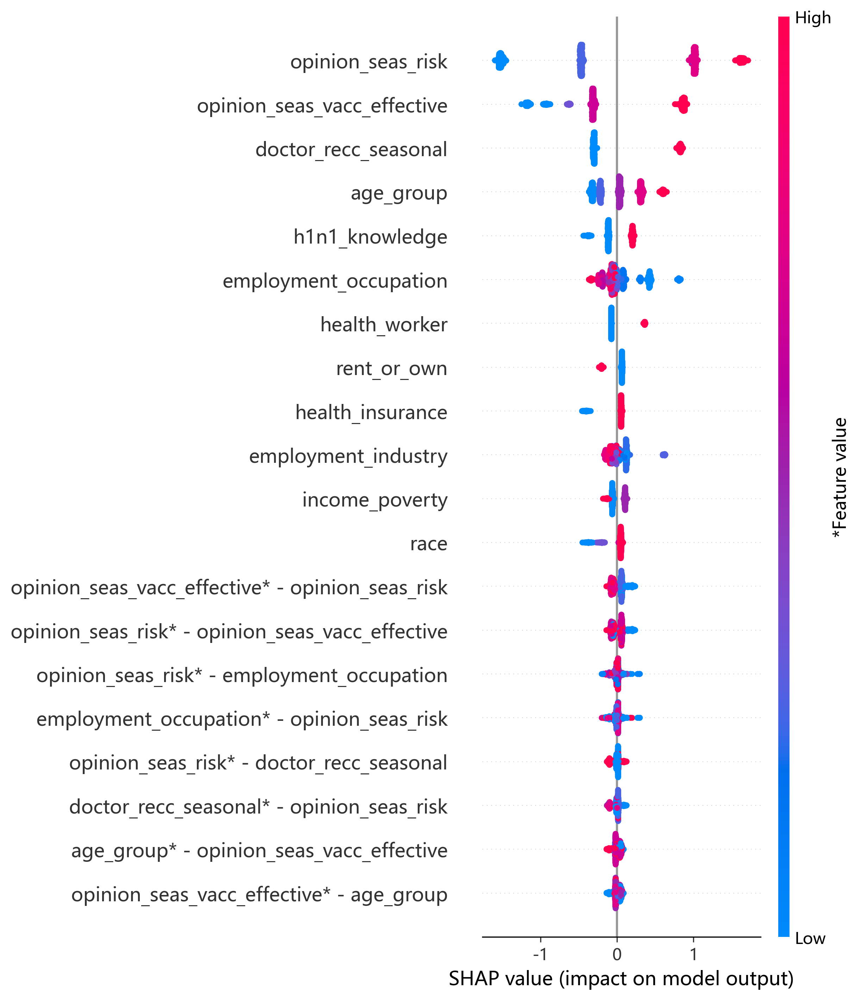

In [46]:
# Interactive sorting
shap_interaction_values = explainer.shap_interaction_values(x_test[f_top])
shap.summary_plot(shap_interaction_values, x_test[f_top],max_display=20,plot_type="compact_dot")# 改数字20

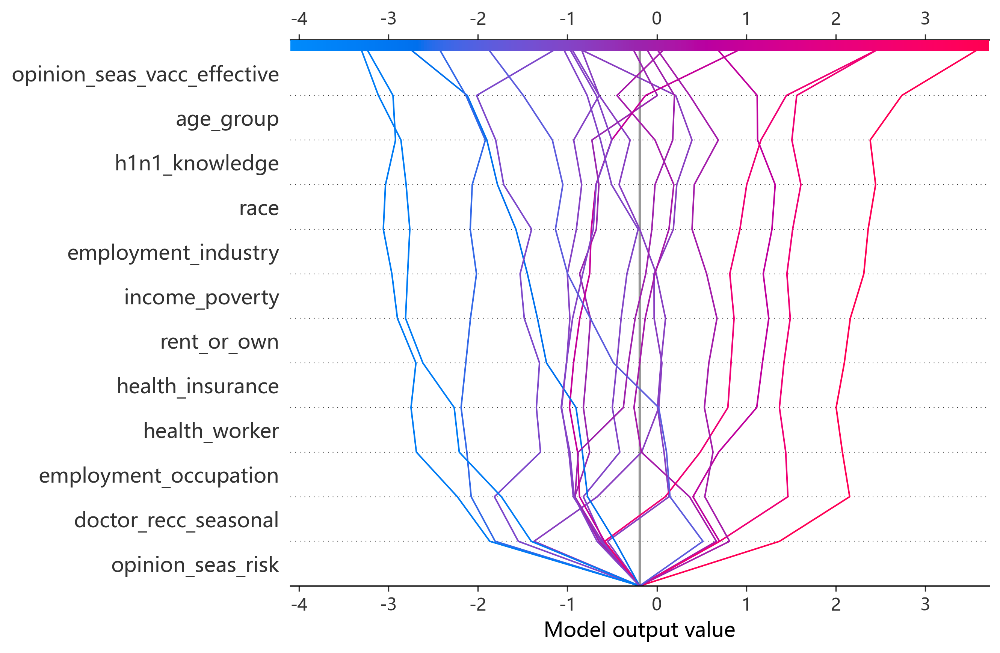

In [47]:
# Decision diagram, top 20 samples only
shap_values1 = explainer.shap_values(x_test[f_top].iloc[:20:])
shap.decision_plot(explainer.expected_value, shap_values1, 
                   x_test[f_top].iloc[:20,:], feature_order='hclust')